In [ ]:
%%bash
# Colab-specific setup
!(stat -t /usr/local/lib/*/dist-packages/google/colab > /dev/null 2>&1) && exit
pip install yacs 2>&1 >> install.log
git init 2>&1 >> install.log
git remote add origin https://github.com/CSAILVision/semantic-segmentation-pytorch.git 2>> install.log
git pull origin master 2>&1 >> install.log
DOWNLOAD_ONLY=1 ./demo_test.sh 2>> install.log

hint: Using 'master' as the name for the initial branch. This default branch name
hint: is subject to change. To configure the initial branch name to use in all
hint: of your new repositories, which will suppress this warning, call:
hint: 
hint: 	git config --global init.defaultBranch <name>
hint: 
hint: Names commonly chosen instead of 'master' are 'main', 'trunk' and
hint: 'development'. The just-created branch can be renamed via this command:
hint: 
hint: 	git branch -m <name>
From https://github.com/CSAILVision/semantic-segmentation-pytorch
 * branch            master     -> FETCH_HEAD
 * [new branch]      master     -> origin/master


In [ ]:
import os
import tensorflow as tf
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

import IPython.display as display

import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['figure.figsize'] = (12, 12)
mpl.rcParams['axes.grid'] = False

import numpy as np
import PIL.Image
import time
import functools

In [ ]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [ ]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

195196/195196 [==============================] - 0s 0us/step


In [ ]:
def load_img(path_to_img):
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  return img

def resize_load_img(path_to_img, target_shape):
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  img = tf.image.resize(img, target_shape)
  img = img[tf.newaxis, :]
  return img

def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

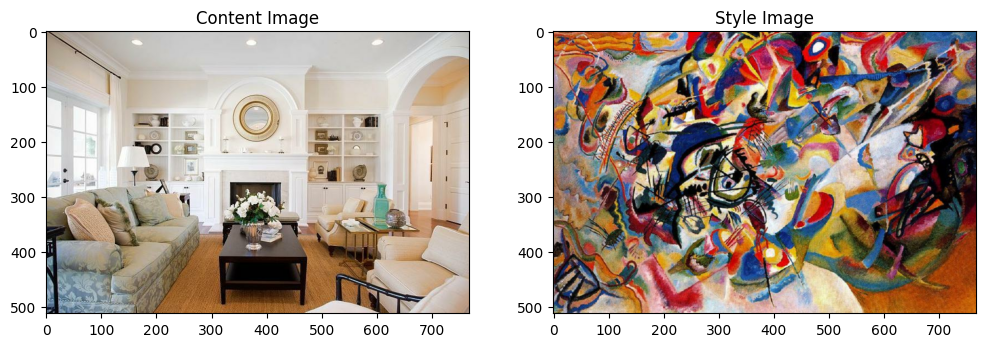

In [ ]:
original_image_path = 'ADE_val_00001519.jpg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
style = (style_image.numpy()[0] * 255).astype(np.uint8)
style = cv2.cvtColor(style, cv2.COLOR_RGB2BGR)
cv2.imwrite("kandinsky5_style.png", style)

True

In [ ]:
import tensorflow_hub as hub
import cv2
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("kandinsky5_stylized_img.png", stylized_img)

True

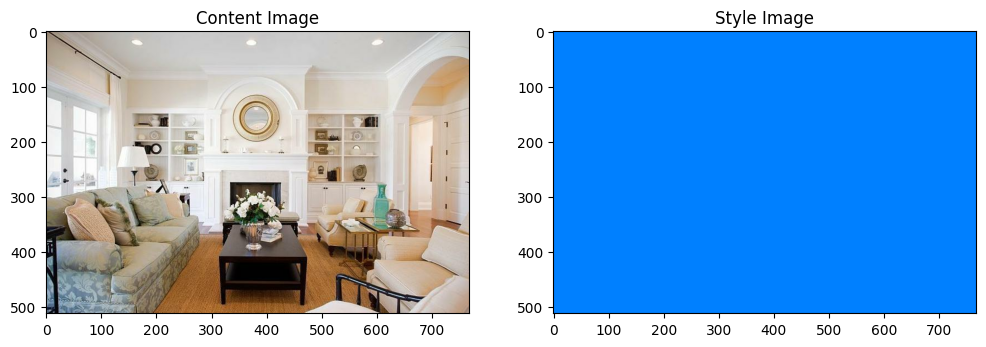

In [ ]:
original_image_path = 'ADE_val_00001519.jpg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_path = 'blue.jpeg'
style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
import tensorflow_hub as hub
import cv2
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("blue_stylized_img.png", stylized_img)

True

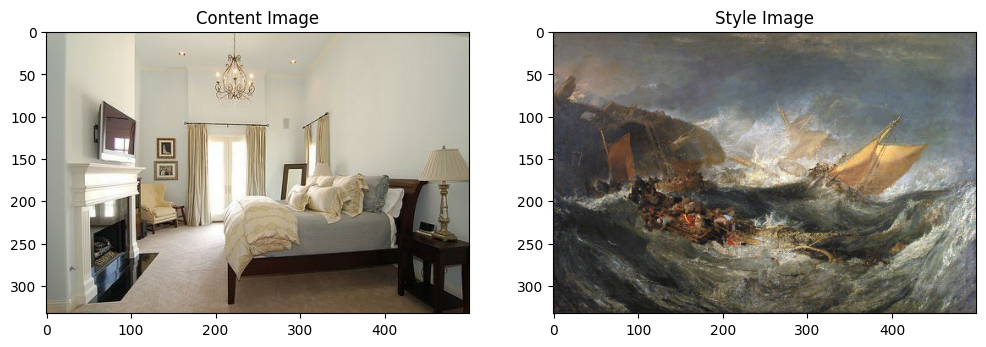

In [ ]:
original_image_path = 'ADE_val_00001149.jpg'
style_path = 'Shipwreck_turner.jpg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("stylized_img4.png", stylized_img)

True

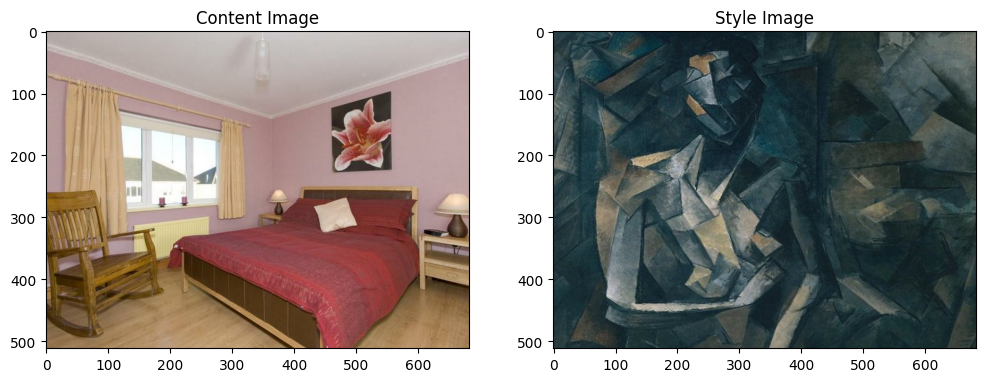

In [ ]:
original_image_path = 'ADE_val_00000151.jpg'
style_path = 'picasso.jpg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("stylized_img1.png", stylized_img)

True

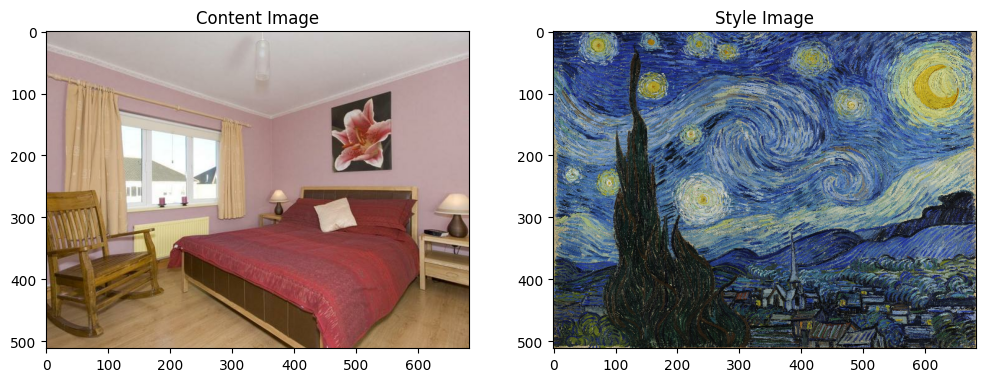

In [ ]:
original_image_path = 'ADE_val_00000151.jpg'
style_path = 'Van_Gogh.jpeg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("stylized_img2.png", stylized_img)

True

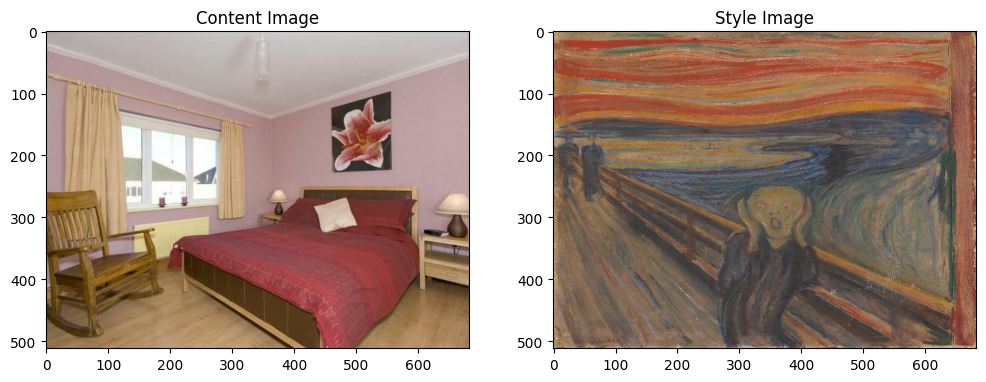

In [ ]:
original_image_path = 'ADE_val_00000151.jpg'
style_path = 'Edvard_Munch.jpeg'
original_image = load_img(original_image_path)
content_image = resize_load_img(original_image_path, (original_image.shape[0], original_image.shape[1]))

style_image = resize_load_img(style_path, (original_image.shape[0], original_image.shape[1]))

plt.subplot(1, 2, 1)
imshow(content_image, 'Content Image')

plt.subplot(1, 2, 2)
imshow(style_image, 'Style Image')

assert content_image.shape == style_image.shape

In [ ]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]
tensor_to_image(stylized_image)

stylized_img = (stylized_image.numpy()[0] * 255).astype(np.uint8)
stylized_img = cv2.cvtColor(stylized_img, cv2.COLOR_RGB2BGR)
cv2.imwrite("stylized_img3.png", stylized_img)

True

In [ ]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')

    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    display(PIL.Image.fromarray(im_vis))

In [ ]:
# Network Builders
net_encoder = ModelBuilder.build_encoder(
    arch='resnet50dilated',
    fc_dim=2048,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/encoder_epoch_20.pth')
net_decoder = ModelBuilder.build_decoder(
    arch='ppm_deepsup',
    fc_dim=2048,
    num_class=150,
    weights='ckpt/ade20k-resnet50dilated-ppm_deepsup/decoder_epoch_20.pth',
    use_softmax=True)

crit = torch.nn.NLLLoss(ignore_index=-1)
segmentation_module = SegmentationModule(net_encoder, net_decoder, crit)
segmentation_module.eval()
segmentation_module.cuda()

Loading weights for net_encoder
Loading weights for net_decoder


SegmentationModule(
  (encoder): ResnetDilated(
    (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
    (bn1): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu1): ReLU(inplace=True)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): SynchronizedBatchNorm2d(64, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu2): ReLU(inplace=True)
    (conv3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): SynchronizedBatchNorm2d(128, eps=1e-05, momentum=0.001, affine=True, track_running_stats=True)
    (relu3): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(128, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): SynchronizedBatchNorm2d(64, eps=1

In [ ]:
def get_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')

    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.array(pred_color)
    # display(PIL.Image.fromarray(im_vis))
    plt.figure(figsize=(10, 10))
    plt.imshow(im_vis)
    plt.axis('off')
    plt.show()
    return im_vis

In [ ]:
def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')

    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    #im_vis = numpy.concatenate((img, pred_color), axis=1)
    #display(PIL.Image.fromarray(im_vis))
    plt.figure(figsize=(10, 10))
    plt.imshow(pred_color)
    plt.axis('off')
    plt.show()

    return pred_color

sofa:


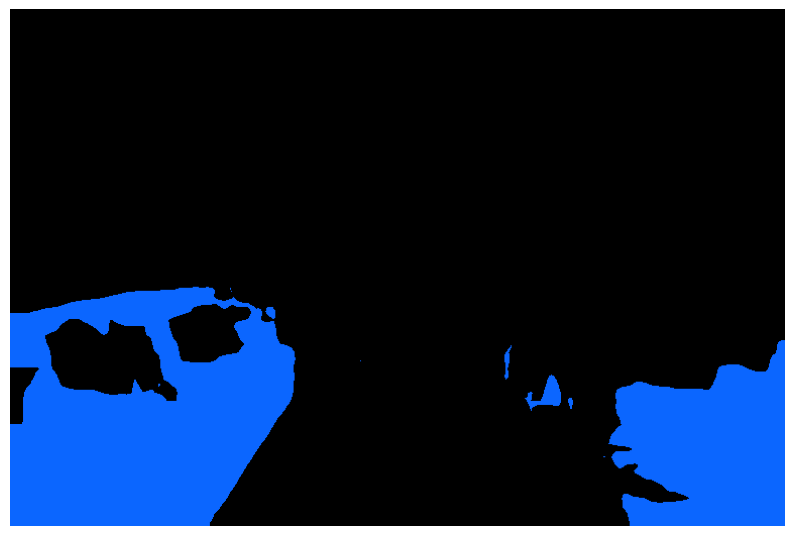

In [ ]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00001519.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()


wall = get_result(img_original, pred, 23)
wall_location = []
for x in range(wall.shape[0]):
    for y in range(wall.shape[1]):
        if (wall[x][y] !=[0, 0, 0]).any():
            wall_location.append((x, y))

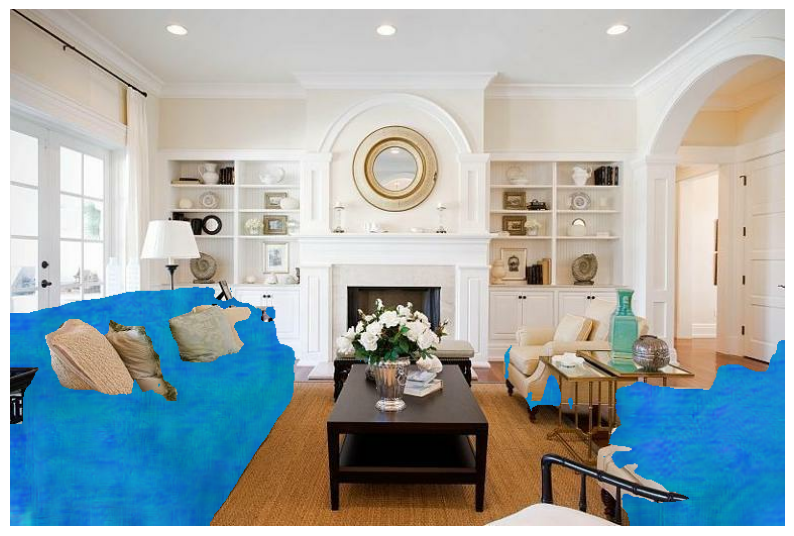

In [ ]:
import matplotlib.pyplot as plt

newImage = content_image.numpy()[0].copy()
for (x, y) in wall_location:
  newImage[x][y] = stylized_image.numpy()[0][x][y]

plt.figure(figsize=(10, 10))
plt.imshow(newImage)
plt.axis('off')
plt.show()

In [ ]:
import cv2
import numpy as np
img = (newImage * 255).astype(np.uint8)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
cv2.imwrite("blue_style_sofa.png", img)

True

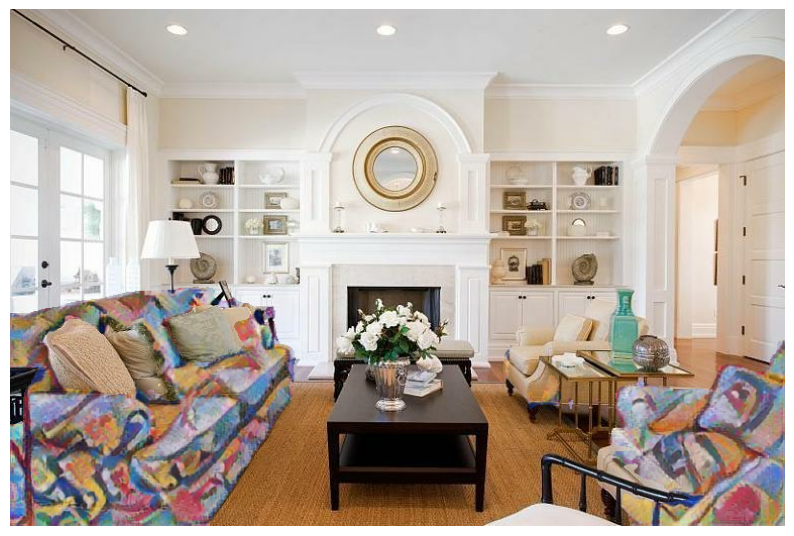

In [ ]:
import matplotlib.pyplot as plt

newImage = content_image.numpy()[0].copy()
for (x, y) in wall_location:
  newImage[x][y] = stylized_image.numpy()[0][x][y]

plt.figure(figsize=(10, 10))
plt.imshow(newImage)
plt.axis('off')
plt.show()

In [ ]:
import cv2
import numpy as np
img = (newImage * 255).astype(np.uint8)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
cv2.imwrite("kandinsky5_style_sofa.png", img)

True

In [ ]:
names

{1: 'wall',
 2: 'building',
 3: 'sky',
 4: 'floor',
 5: 'tree',
 6: 'ceiling',
 7: 'road',
 8: 'bed',
 9: 'windowpane',
 10: 'grass',
 11: 'cabinet',
 12: 'sidewalk',
 13: 'person',
 14: 'earth',
 15: 'door',
 16: 'table',
 17: 'mountain',
 18: 'plant',
 19: 'curtain',
 20: 'chair',
 21: 'car',
 22: 'water',
 23: 'painting',
 24: 'sofa',
 25: 'shelf',
 26: 'house',
 27: 'sea',
 28: 'mirror',
 29: 'rug',
 30: 'field',
 31: 'armchair',
 32: 'seat',
 33: 'fence',
 34: 'desk',
 35: 'rock',
 36: 'wardrobe',
 37: 'lamp',
 38: 'bathtub',
 39: 'railing',
 40: 'cushion',
 41: 'base',
 42: 'box',
 43: 'column',
 44: 'signboard',
 45: 'chest',
 46: 'counter',
 47: 'sand',
 48: 'sink',
 49: 'skyscraper',
 50: 'fireplace',
 51: 'refrigerator',
 52: 'grandstand',
 53: 'path',
 54: 'stairs',
 55: 'runway',
 56: 'case',
 57: 'pool',
 58: 'pillow',
 59: 'screen',
 60: 'stairway',
 61: 'river',
 62: 'bridge',
 63: 'bookcase',
 64: 'blind',
 65: 'coffee',
 66: 'toilet',
 67: 'flower',
 68: 'book',
 69: '

wall:


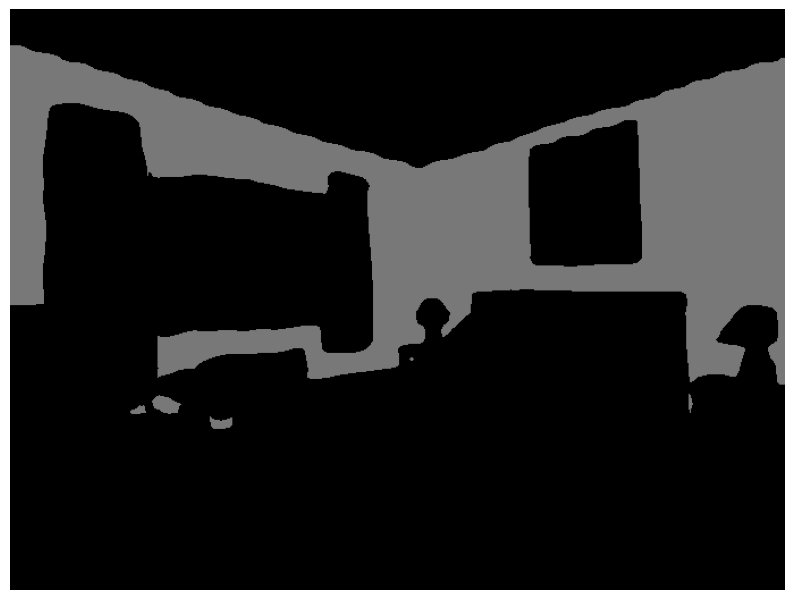

bed:


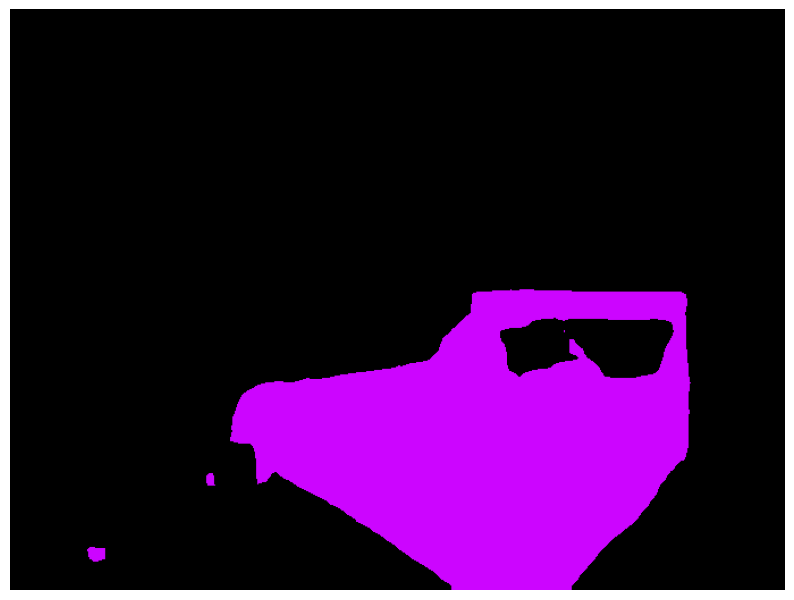

ceiling:


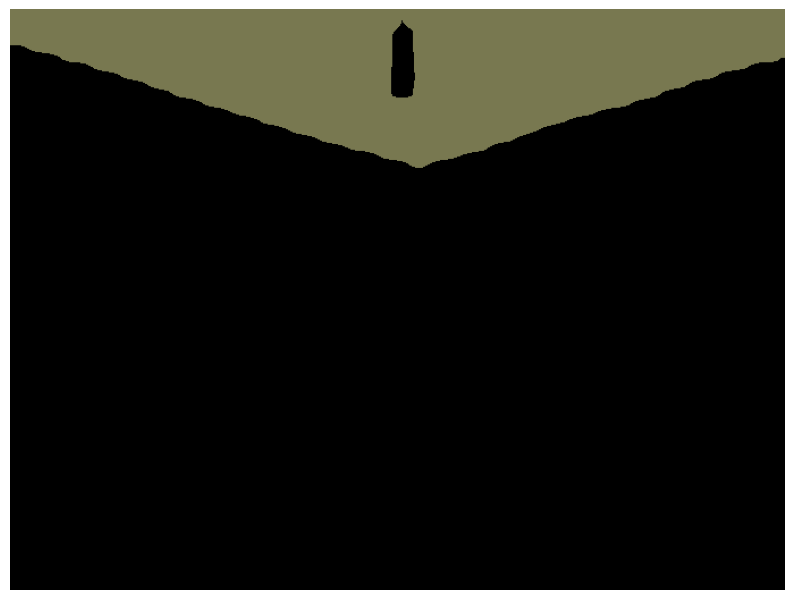

floor:


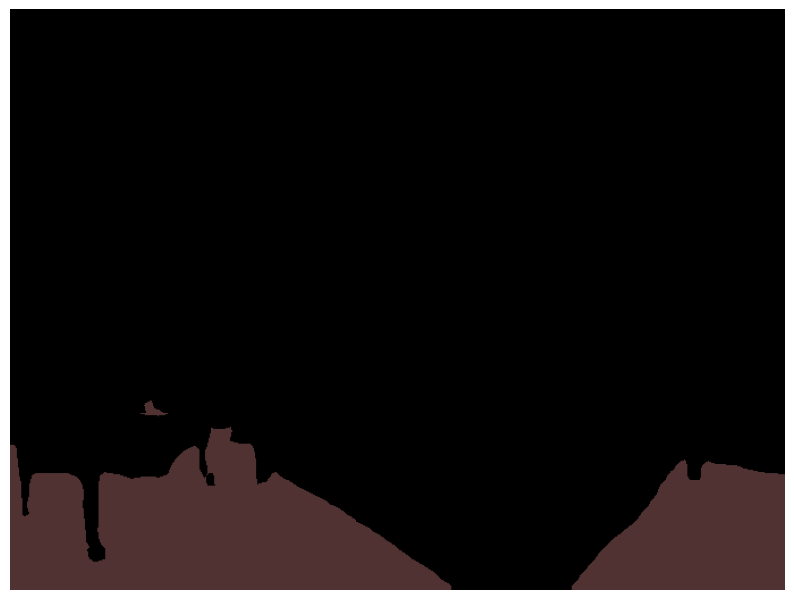

curtain:


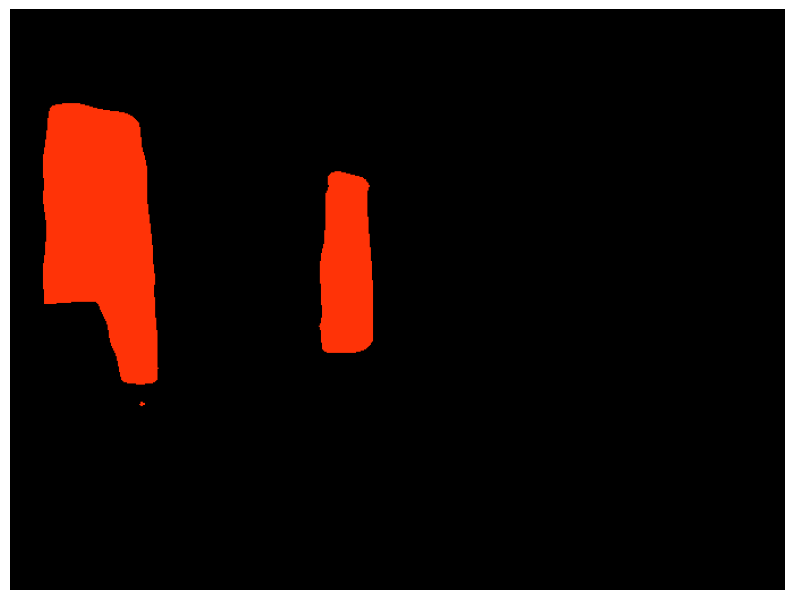

windowpane:


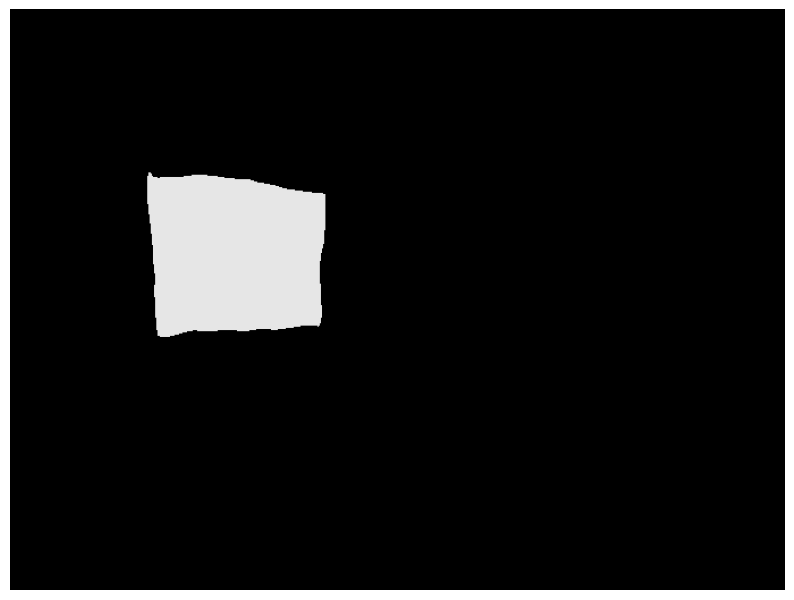

chair:


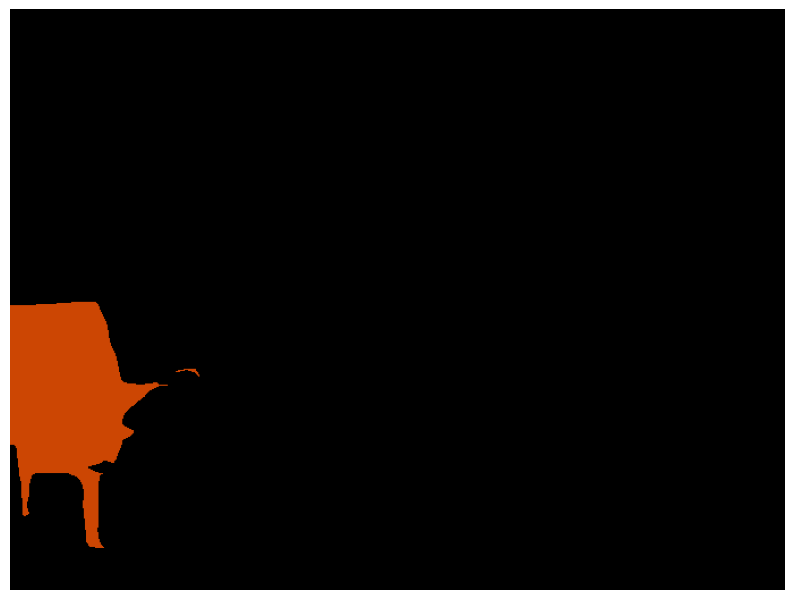

painting:


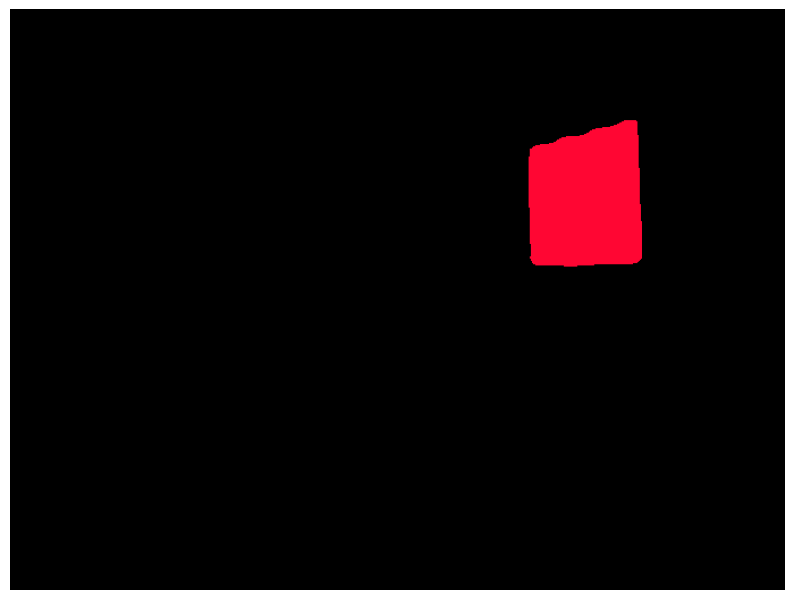

table:


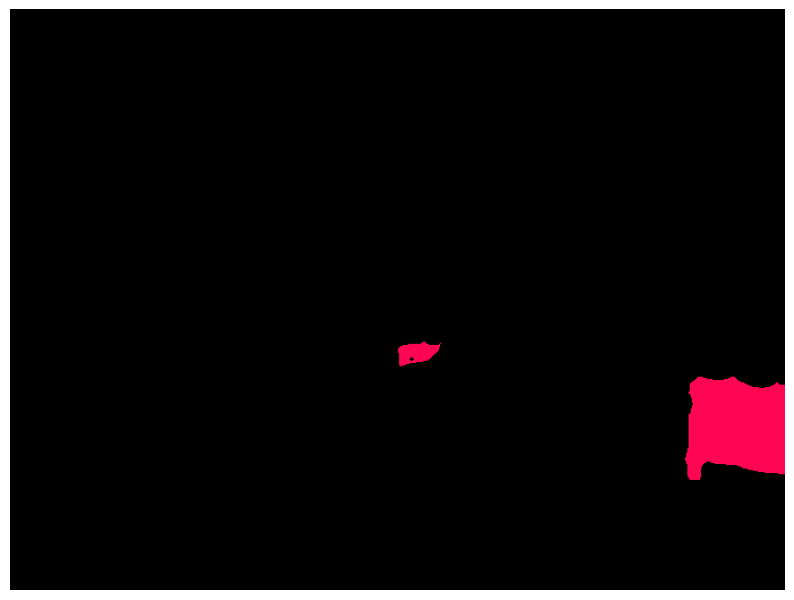

armchair:


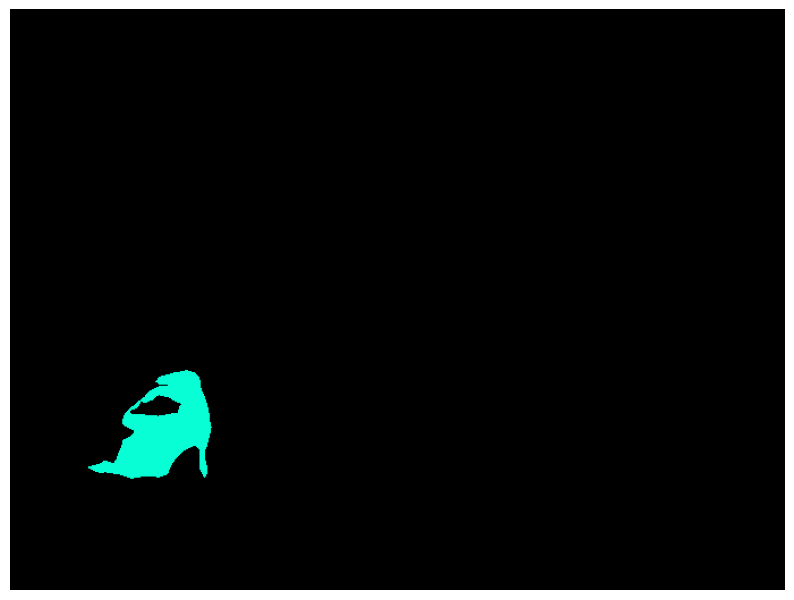

lamp:


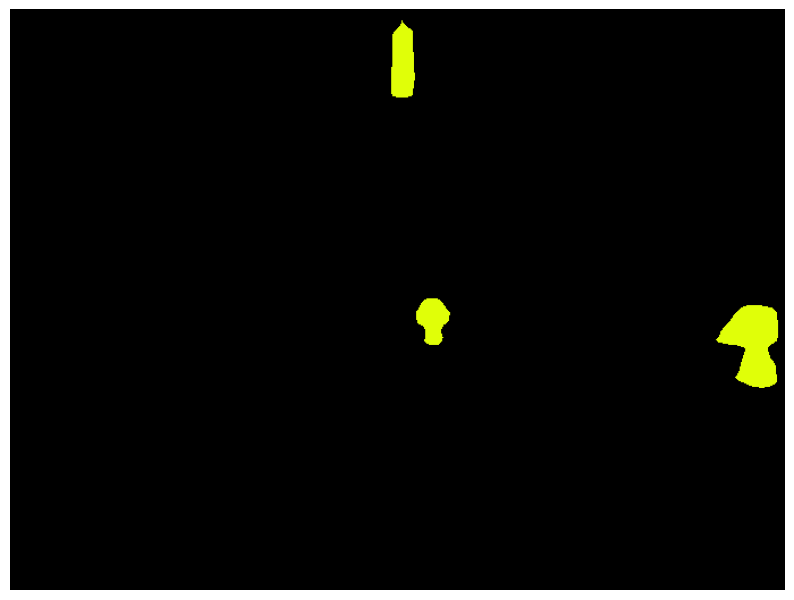

pillow:


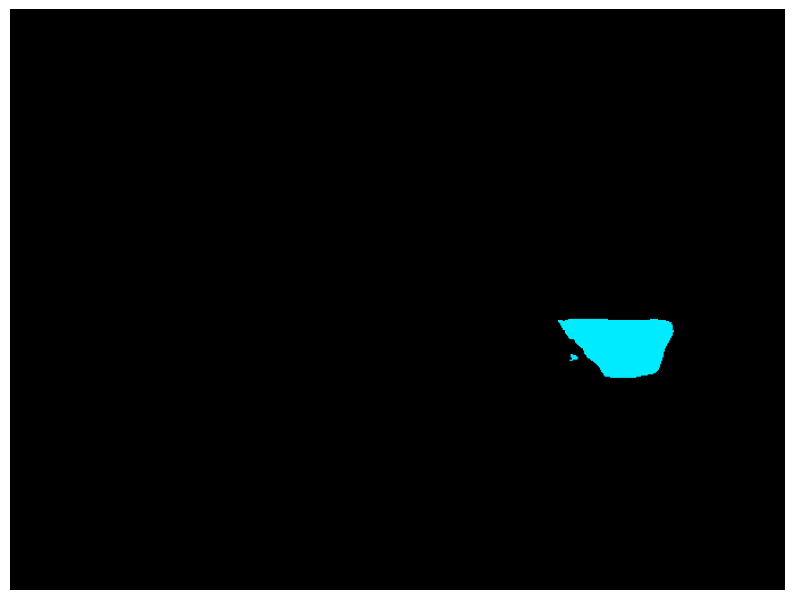

radiator:


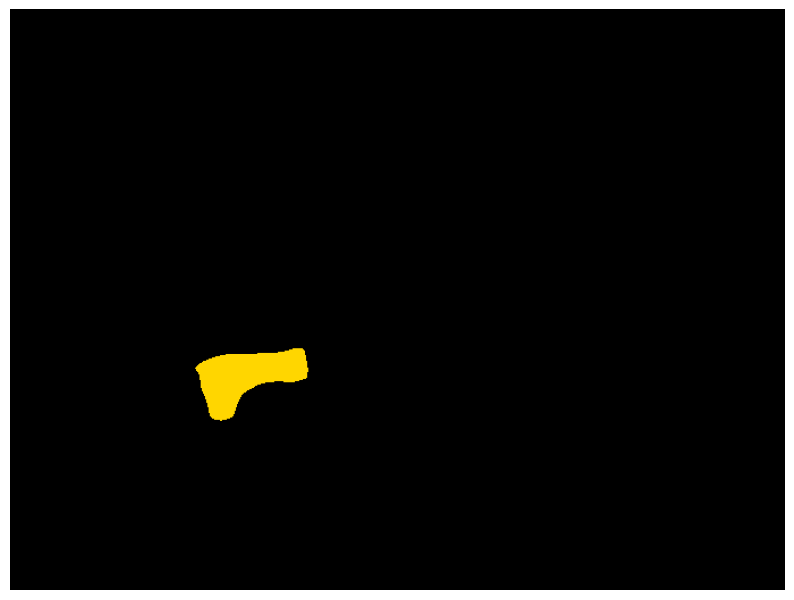

cushion:


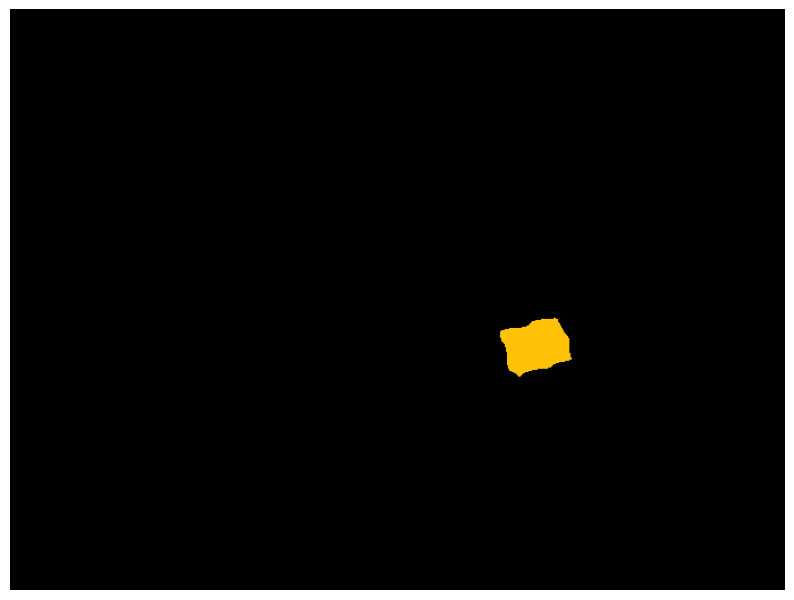

clock:


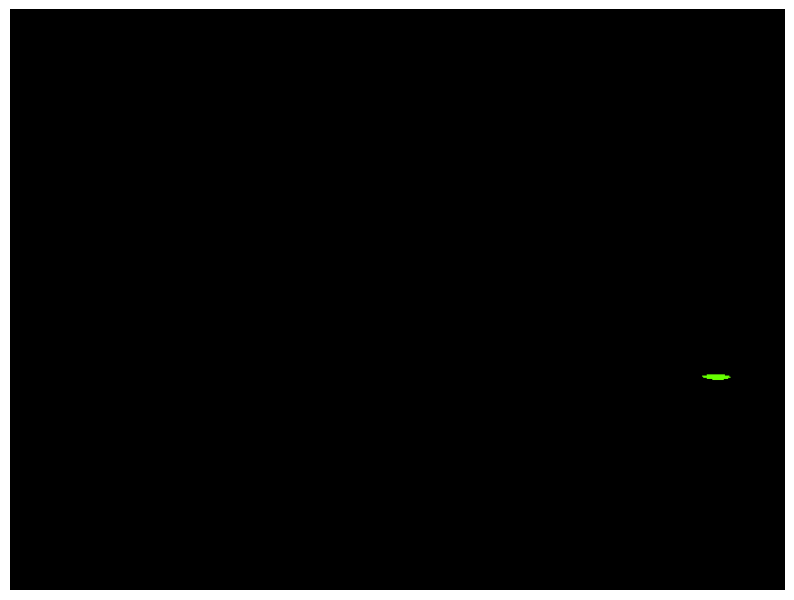

In [ ]:
# Top classes in answer
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    visualize_result(img_original, pred, c)

wall:


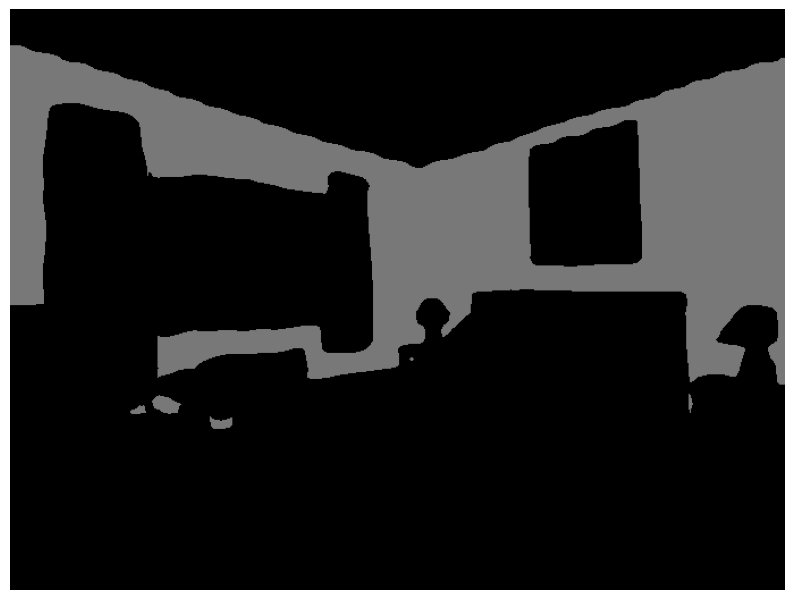

In [ ]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00000151.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()


wall = get_result(img_original, pred, 0)
wall_location = []
for x in range(wall.shape[0]):
    for y in range(wall.shape[1]):
        if (wall[x][y] !=[0, 0, 0]).any():
            wall_location.append((x, y))

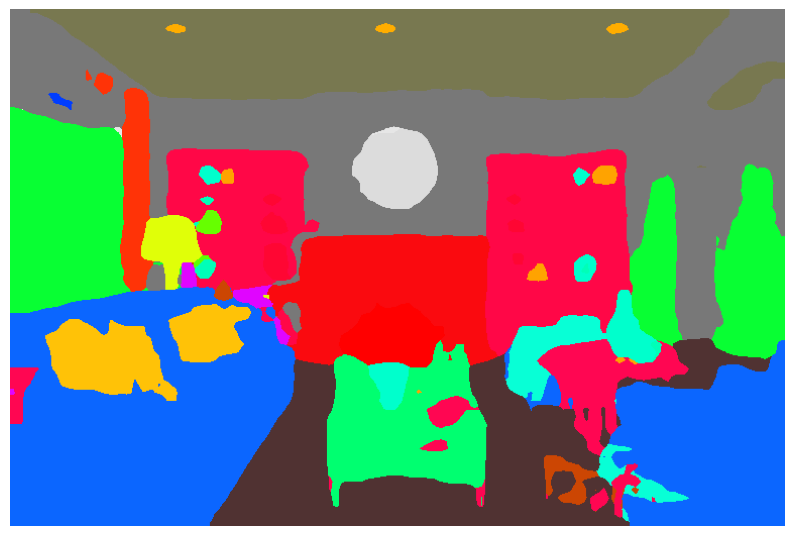

True

In [ ]:
seg_pred = visualize_result(img_original, pred)

seg_pred = seg_pred.astype(np.uint8)
# seg_pred = cv2.cvtColor(seg_pred, cv2.COLOR_RGB2BGR)
cv2.imwrite("seg_pred.png", pred)

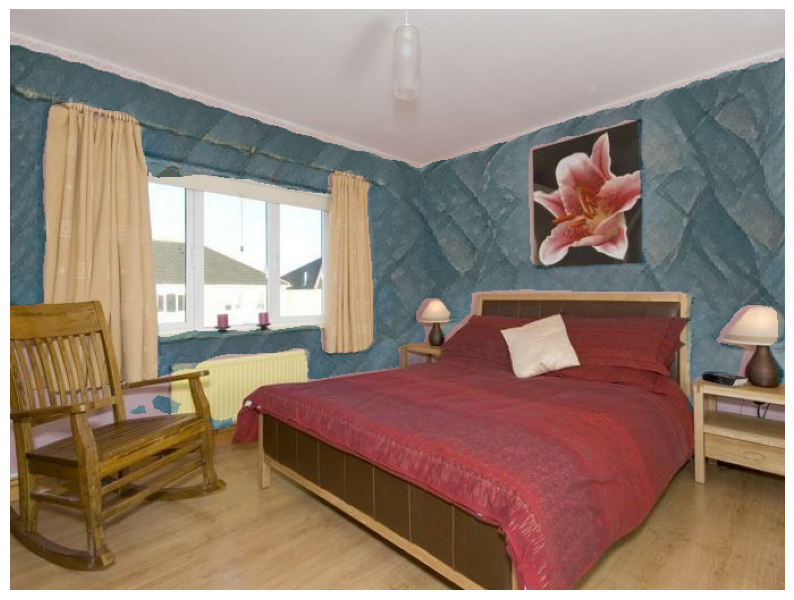

In [ ]:
import matplotlib.pyplot as plt

newImage = content_image.numpy()[0].copy()
for (x, y) in wall_location:
  newImage[x][y] = stylized_image.numpy()[0][x][y]

plt.figure(figsize=(10, 10))
plt.imshow(newImage)
plt.axis('off')
plt.show()

In [ ]:
import cv2
import numpy as np
img = (newImage * 255).astype(np.uint8)
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
cv2.imwrite("wall_picasso.png", img)

True

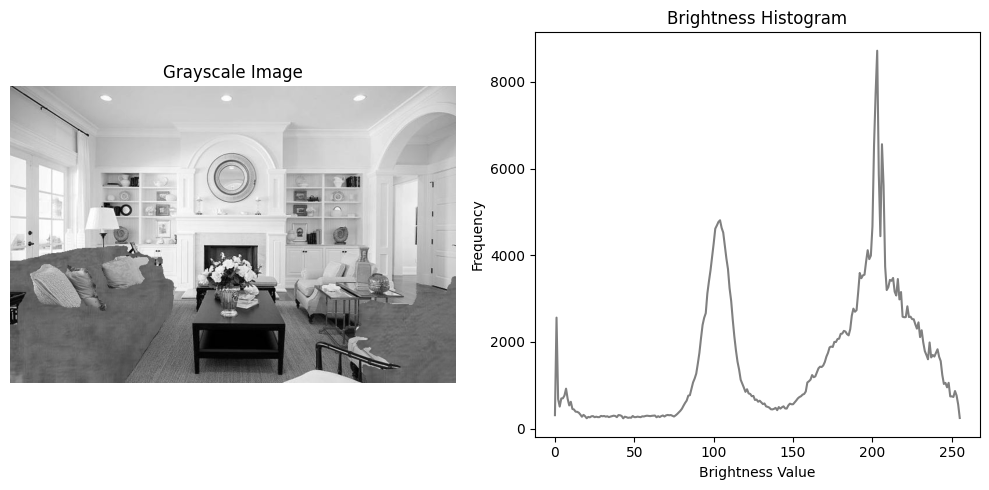

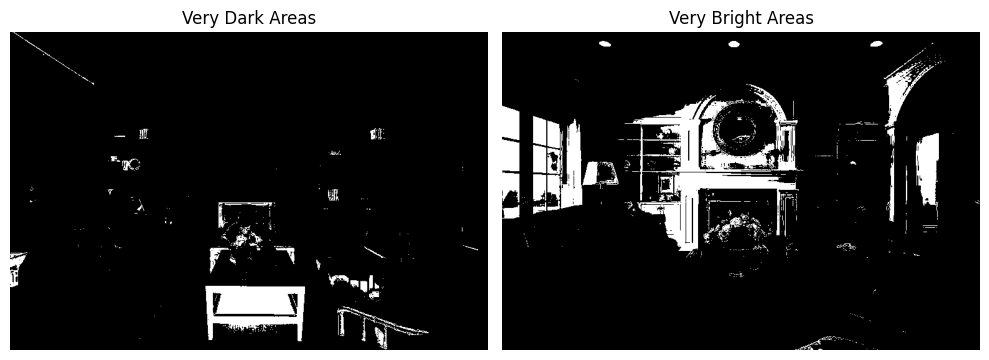

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image, ImageStat
import numpy as np

def analyze_image(image_path):
    # Load the image
    img = Image.open(image_path)

    # Convert image to grayscale
    img_gray = img.convert('L')

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img_gray, cmap='gray')
    plt.title('Grayscale Image')
    plt.axis('off')

    # Calculate and display histogram
    plt.subplot(1, 2, 2)
    histogram = img_gray.histogram()
    plt.plot(histogram, color='gray')
    plt.title('Brightness Histogram')
    plt.xlabel('Brightness Value')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

    # Analyze dark and bright areas
    threshold_dark = 30  # brightness levels below this are considered very dark
    threshold_bright = 225  # brightness levels above this are considered very bright

    # Create masks for dark and bright areas
    np_img = np.array(img_gray)
    dark_mask = np_img < threshold_dark
    bright_mask = np_img > threshold_bright

    # Display dark and bright areas
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(dark_mask, cmap='gray')
    plt.title('Very Dark Areas')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(bright_mask, cmap='gray')
    plt.title('Very Bright Areas')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Replace 'path_to_your_image.jpg' with the path to your image file
analyze_image('blue_sofa.png')

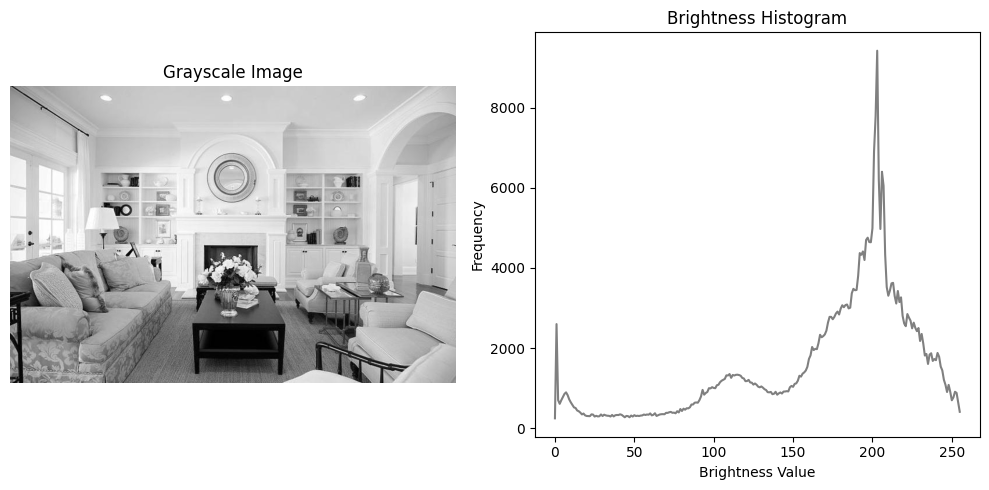

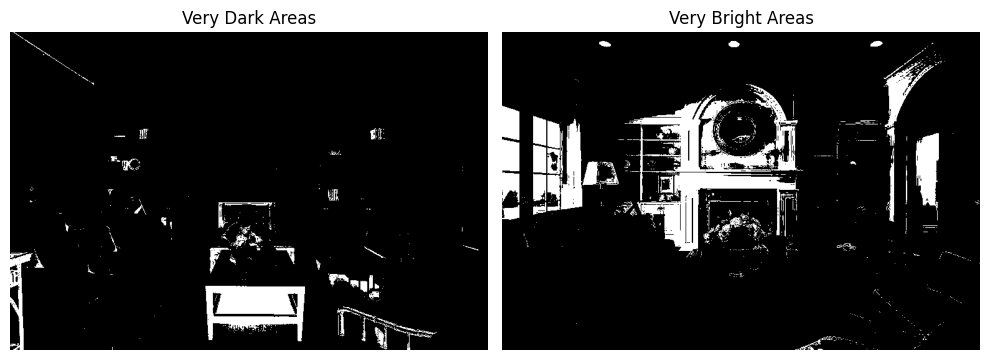

In [ ]:
analyze_image('ADE_val_00001519.jpg')

[[  0 255 255 ...   0   0   0]
 [  0   0 255 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0 255   0 ...   0   0   0]
 [255   0   0 ...   0   0   0]
 [255   0   0 ...   0   0   0]]


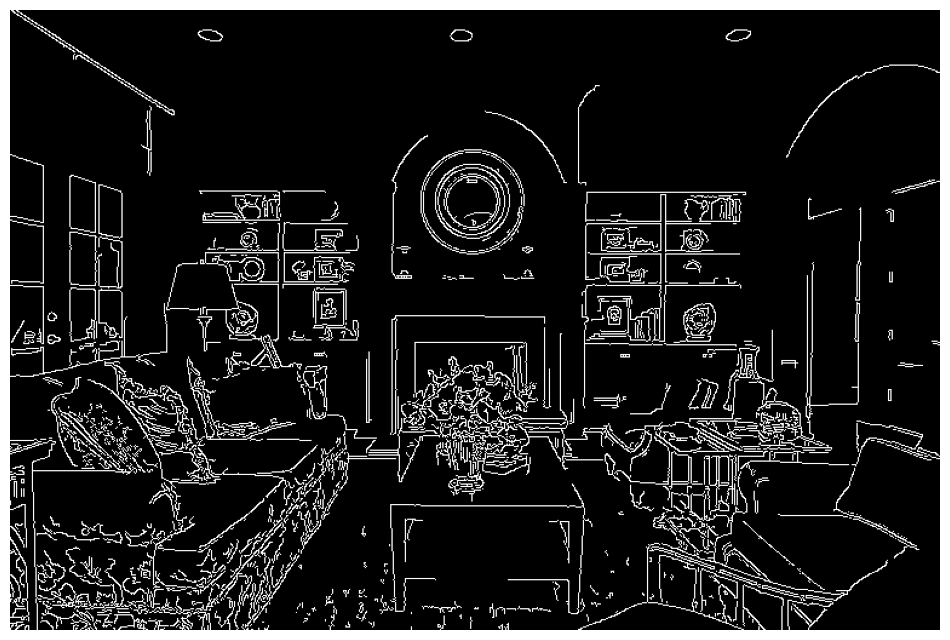

In [ ]:
import cv2
import matplotlib.pyplot as plt

def analyze_edges(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    edges = cv2.Canny(gray, 100, 200)
    print(edges)

    plt.imshow(edges, cmap='gray')
    plt.axis("off")

    # plt.figure(figsize=(8, 4))
    # plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    # plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    # plt.subplot(122), plt.imshow(edges, cmap='gray')
    # plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    # plt.show()

#analyze_edges('blue_style_sofa.png')
analyze_edges('ADE_val_00001519.jpg')

In [ ]:
for (x, y) in wall_location:
    if edges[x][y] == 255 and gradient_magnitude[x][y] != 0:
    #if gradient_magnitude[x][y] != 0:
        newImagee[x][y] = newImagee[x][y] + 0.01 * gradient_magnitude[x][y]#content_image.numpy()[0][x][y]#[0, 0, 0]

plt.figure(figsize=(10, 10))
plt.imshow(newImagee)
plt.axis('off')
plt.show()

[[  0 255 255 ...   0   0   0]
 [  0   0 255 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [  0 255   0 ...   0   0   0]
 [255   0   0 ...   0   0   0]
 [255   0   0 ...   0   0   0]]


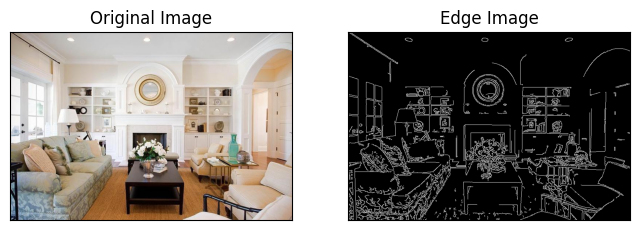

In [ ]:
import cv2
import matplotlib.pyplot as plt

def get_edges(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    edges = cv2.Canny(gray, 100, 200)
    print(edges)

    plt.figure(figsize=(8, 4))
    plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122), plt.imshow(edges, cmap='gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()

    return edges

edges = get_edges('ADE_val_00001519.jpg')

[[   0.         1604.         2752.         ...   44.
    42.            0.        ]
 [ 754.         1667.9718223  3038.60231027 ...   45.65084884
    48.08326112   42.        ]
 [ 468.          945.064019   2119.88348736 ...   50.91168825
    45.65084884   44.        ]
 ...
 [1226.         1261.74006832 1239.29818849 ...  434.05299216
   186.01075238   52.        ]
 [ 898.          818.44975411  953.33729603 ...  259.35689696
    52.80151513   22.        ]
 [   0.          204.          744.         ...  162.
     4.            0.        ]]


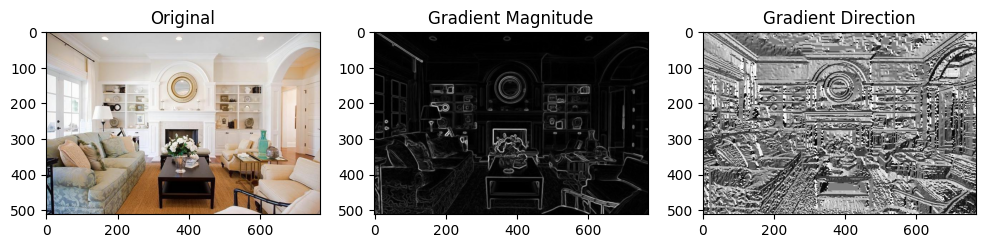

In [ ]:
def get_light_direction(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)

    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)

    gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    gradient_direction = np.arctan2(sobel_y, sobel_x)

    print(gradient_magnitude)

    plt.figure(figsize=(12, 6))
    plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(132), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
    plt.subplot(133), plt.imshow(gradient_direction, cmap='gray'), plt.title('Gradient Direction')
    plt.show()
    return gradient_magnitude

gradient_magnitude = get_light_direction('ADE_val_00001519.jpg')

In [ ]:
gradient_magnitude[0][0]

0.0

In [ ]:
edges.shape

(512, 768)

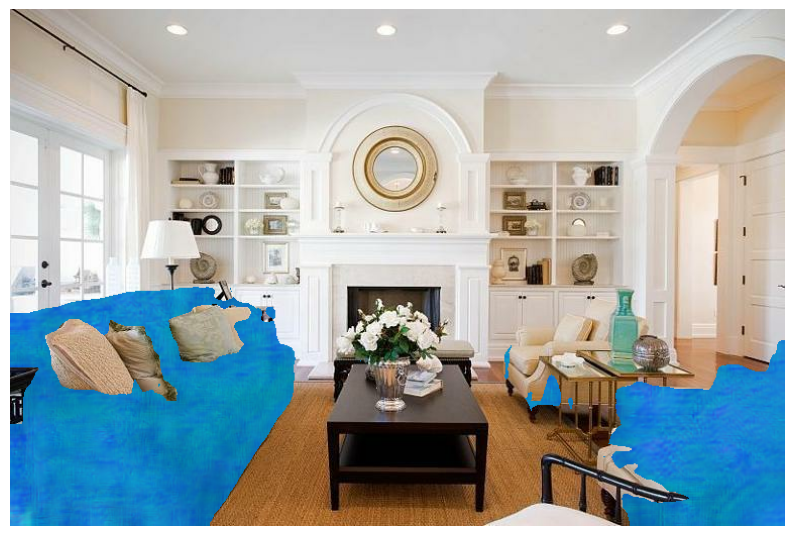

In [ ]:
plt.figure(figsize=(10, 10))
plt.imshow(newImage)
plt.axis('off')
plt.show()

In [ ]:
newImagee = newImage.copy()

In [ ]:
newImagee[0][0] + 0.1

array([0.7039216 , 0.63725495, 0.609804  ], dtype=float32)

In [ ]:
content_image.numpy()[0][0][0]

array([0.6039216 , 0.5372549 , 0.50980395], dtype=float32)

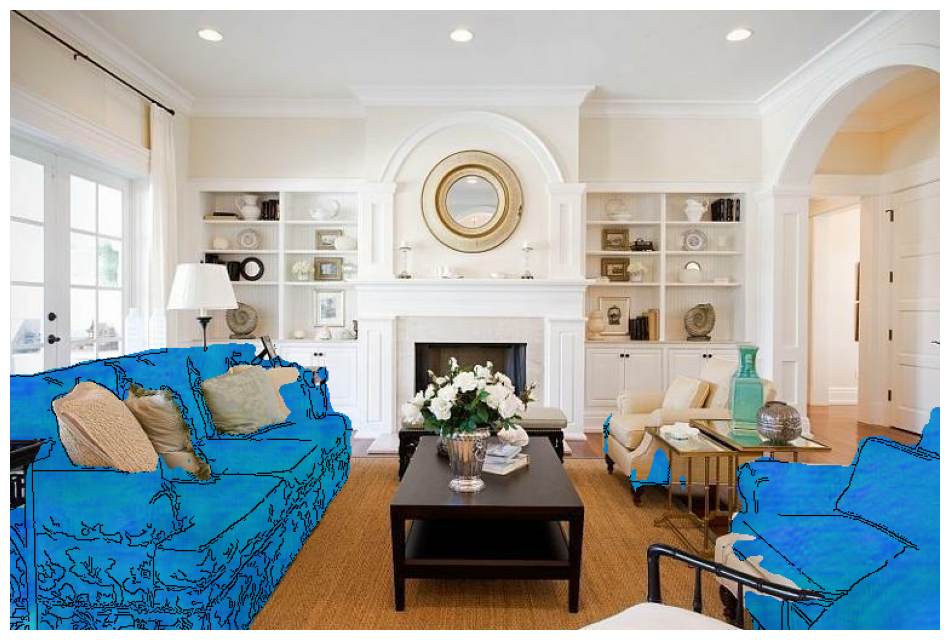

In [ ]:
for (x, y) in wall_location:
    if edges[x][y] == 255:
    #if gradient_magnitude[x][y] != 0:
        newImagee[x][y] = [0, 0, 0]#newImagee[x][y] + 0.01 * gradient_magnitude[x][y]#content_image.numpy()[0][x][y]#[0, 0, 0]

#plt.figure(figsize=(10, 10))
plt.imshow(newImagee)
plt.axis('off')
plt.show()

[[0.00000000e+00 1.60800000e+03 2.76200000e+03 ... 2.00000000e+01
  2.00000000e+00 0.00000000e+00]
 [7.44000000e+02 1.66398317e+03 3.04044503e+03 ... 3.30151480e+01
  9.89949494e+00 2.00000000e+00]
 [4.66000000e+02 9.43539082e+02 2.11648624e+03 ... 5.93969696e+01
  3.30151480e+01 2.00000000e+01]
 ...
 [1.28000000e+02 1.59831161e+02 1.15801554e+02 ... 1.85951607e+02
  1.87216452e+02 1.90000000e+02]
 [1.06000000e+02 1.25992063e+02 7.68374908e+01 ... 9.57078889e+01
  1.02771591e+02 1.08000000e+02]
 [0.00000000e+00 7.20000000e+01 2.80000000e+01 ... 5.00000000e+01
  2.60000000e+01 0.00000000e+00]]


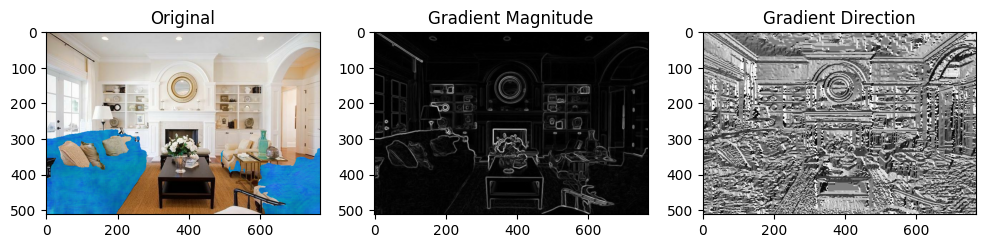

[[   0.         1604.         2752.         ...   44.
    42.            0.        ]
 [ 754.         1667.9718223  3038.60231027 ...   45.65084884
    48.08326112   42.        ]
 [ 468.          945.064019   2119.88348736 ...   50.91168825
    45.65084884   44.        ]
 ...
 [1226.         1261.74006832 1239.29818849 ...  434.05299216
   186.01075238   52.        ]
 [ 898.          818.44975411  953.33729603 ...  259.35689696
    52.80151513   22.        ]
 [   0.          204.          744.         ...  162.
     4.            0.        ]]


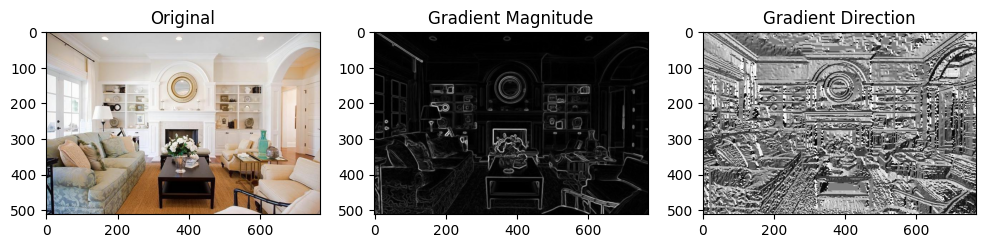

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def light_direction(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = cv2.GaussianBlur(gray, (3, 3), 0)

    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=5)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=5)

    gradient_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    gradient_direction = np.arctan2(sobel_y, sobel_x)

    print(gradient_magnitude)

    plt.figure(figsize=(12, 6))
    plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(132), plt.imshow(gradient_magnitude, cmap='gray'), plt.title('Gradient Magnitude')
    plt.subplot(133), plt.imshow(gradient_direction, cmap='gray'), plt.title('Gradient Direction')
    plt.show()

light_direction('blue_sofa.png')
light_direction('ADE_val_00001519.jpg')

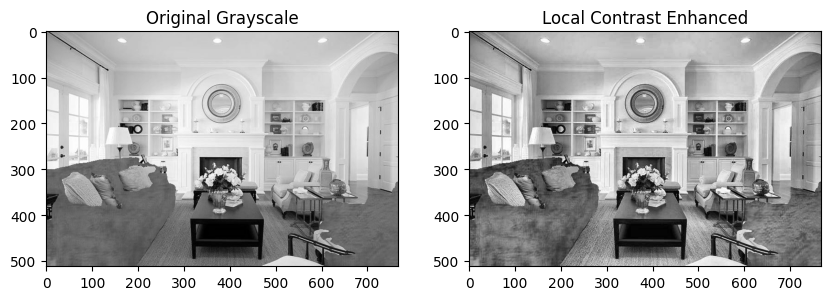

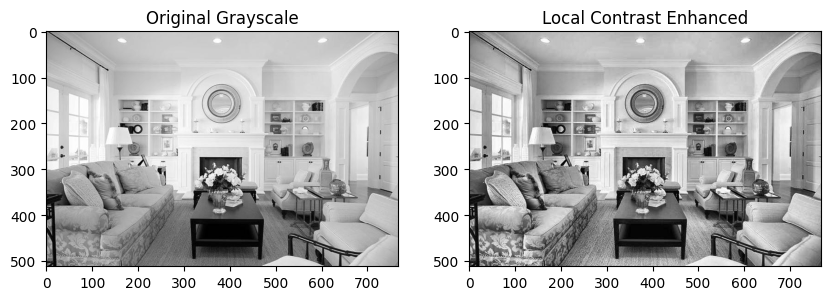

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def local_contrast(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply local contrast enhancement using CLAHE (Contrast Limited Adaptive Histogram Equalization)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    enhanced = clahe.apply(img)

    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('Original Grayscale')
    plt.subplot(122), plt.imshow(enhanced, cmap='gray'), plt.title('Local Contrast Enhanced')
    plt.show()

local_contrast('blue_sofa.png')
local_contrast('ADE_val_00001519.jpg')

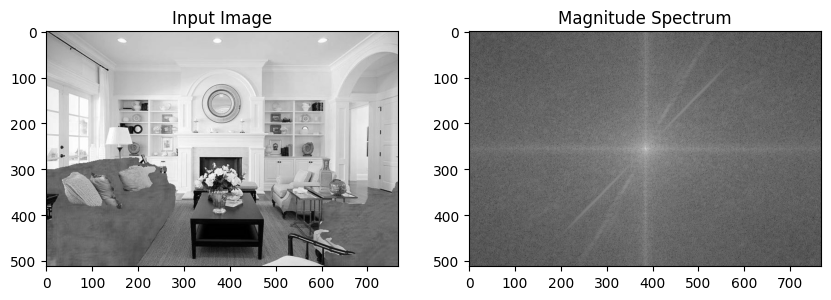

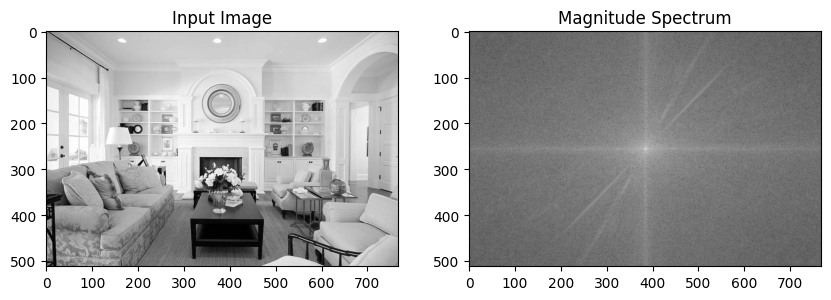

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def frequency_domain_analysis(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))

    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.imshow(img, cmap='gray'), plt.title('Input Image')
    plt.subplot(122), plt.imshow(magnitude_spectrum, cmap='gray'), plt.title('Magnitude Spectrum')
    plt.show()

frequency_domain_analysis('blue_sofa.png')
frequency_domain_analysis('ADE_val_00001519.jpg')

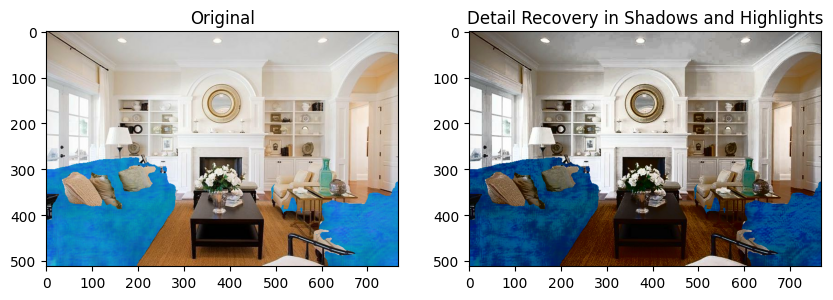

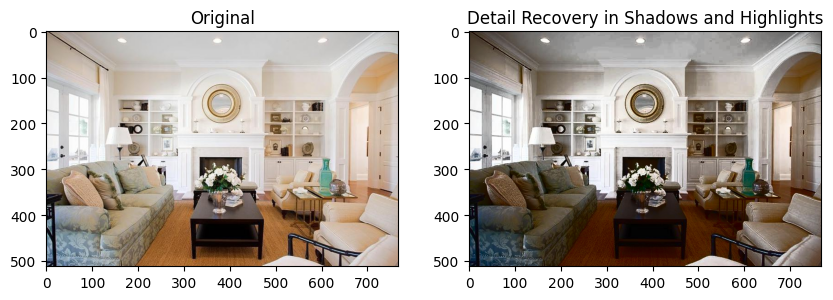

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def detail_recovery(image_path):
    img = cv2.imread(image_path)
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    l, a, b = cv2.split(lab)

    # Applying simple histogram equalization to the L-channel
    equalized_l = cv2.equalizeHist(l)
    updated_lab = cv2.merge([equalized_l, a, b])
    result = cv2.cvtColor(updated_lab, cv2.COLOR_Lab2BGR)

    plt.figure(figsize=(10, 5))
    plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('Original')
    plt.subplot(122), plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB)), plt.title('Detail Recovery in Shadows and Highlights')
    plt.show()

detail_recovery('blue_sofa.png')
detail_recovery('ADE_val_00001519.jpg')

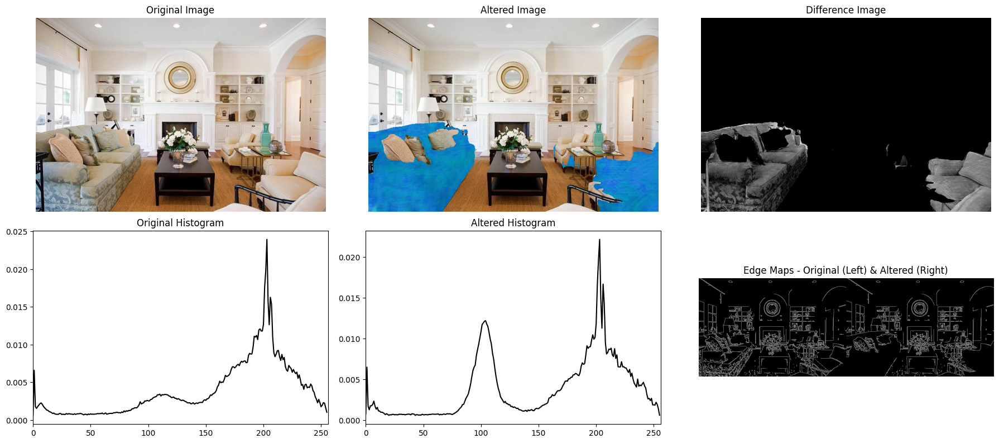

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the images
original_img_path = 'ADE_val_00001519.jpg'
altered_img_path = 'blue_sofa.png'
original_img = cv2.imread(original_img_path)
altered_img = cv2.imread(altered_img_path)

# Convert to grayscale
original_gray = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)
altered_gray = cv2.cvtColor(altered_img, cv2.COLOR_BGR2GRAY)

# Compute absolute difference between the two images
diff_gray = cv2.absdiff(original_gray, altered_gray)

# Compute histograms
original_hist = cv2.calcHist([original_gray], [0], None, [256], [0, 256])
altered_hist = cv2.calcHist([altered_gray], [0], None, [256], [0, 256])

# Normalize histograms
original_hist = original_hist / np.sum(original_hist)
altered_hist = altered_hist / np.sum(altered_hist)

# Edge detection using Canny
original_edges = cv2.Canny(original_gray, 100, 200)
altered_edges = cv2.Canny(altered_gray, 100, 200)

# Plotting
fig, axes = plt.subplots(2, 3, figsize=(18, 8))

# Display original and altered images
axes[0, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(cv2.cvtColor(altered_img, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title('Altered Image')
axes[0, 1].axis('off')

axes[0, 2].imshow(diff_gray, cmap='gray')
axes[0, 2].set_title('Difference Image')
axes[0, 2].axis('off')

# Display histograms
axes[1, 0].plot(original_hist, color='black')
axes[1, 0].set_title('Original Histogram')
axes[1, 0].set_xlim([0, 256])

axes[1, 1].plot(altered_hist, color='black')
axes[1, 1].set_title('Altered Histogram')
axes[1, 1].set_xlim([0, 256])

# Display edge maps
axes[1, 2].imshow(np.hstack((original_edges, altered_edges)), cmap='gray')
axes[1, 2].set_title('Edge Maps - Original (Left) & Altered (Right)')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
min_x, min_y = np.inf, np.inf
max_x, max_y = 0, 0
for (x, y) in sofa_location:
  if x < min_x:
    min_x = x
  if y < min_y:
    min_y = y
  if x > max_x:
    max_x = x
  if y > max_y:
    max_y = y

print(min_x, max_x, min_y, max_y)

275 511 0 767


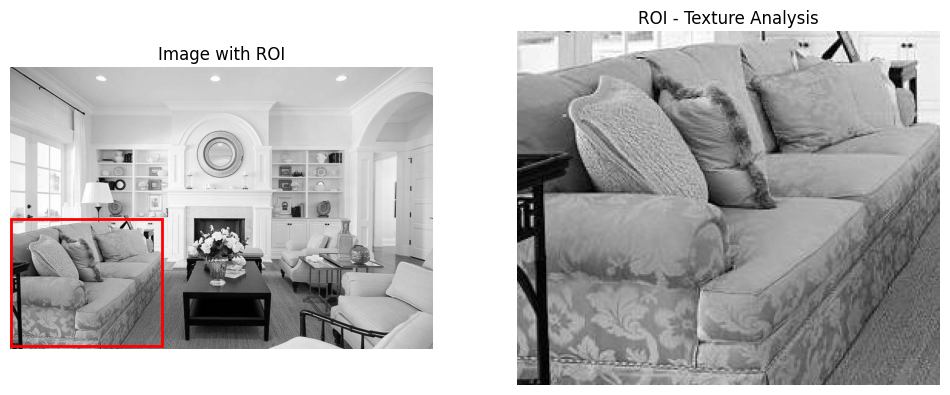

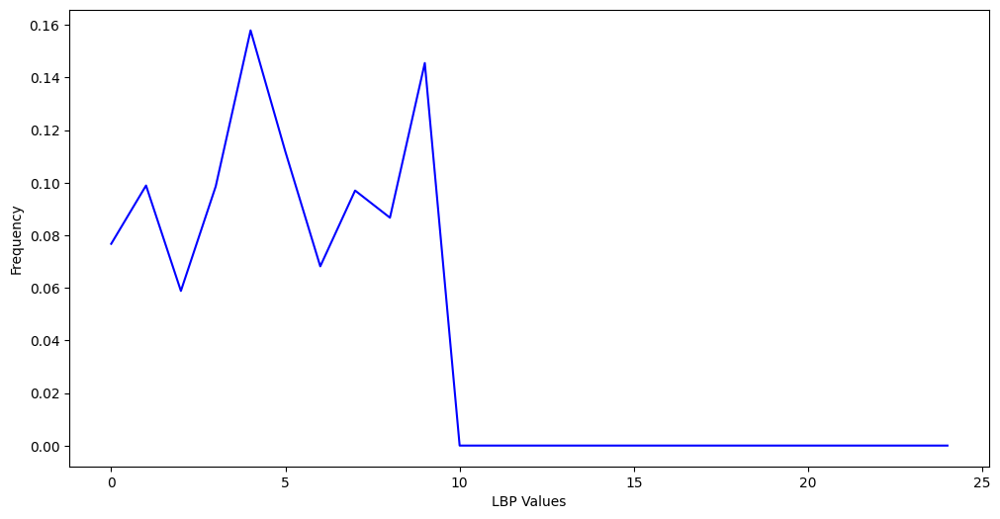

Original Image Texture Features:
{'Contrast': 1328.2148148148149, 'Dissimilarity': 21.444508856682766, 'Homogeneity': 0.09195909808753856, 'Energy': 0.012333813640466195, 'Correlation': 0.6965174133986551, 'LBP Histogram': array([0.07672727, 0.09890909, 0.05881423, 0.09859289, 0.15791304,
       0.11171542, 0.06817391, 0.09699605, 0.08667194, 0.14548617,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])}


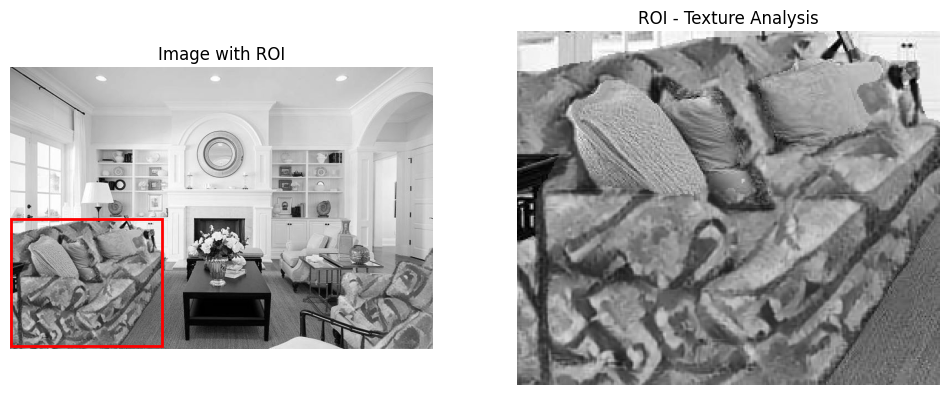

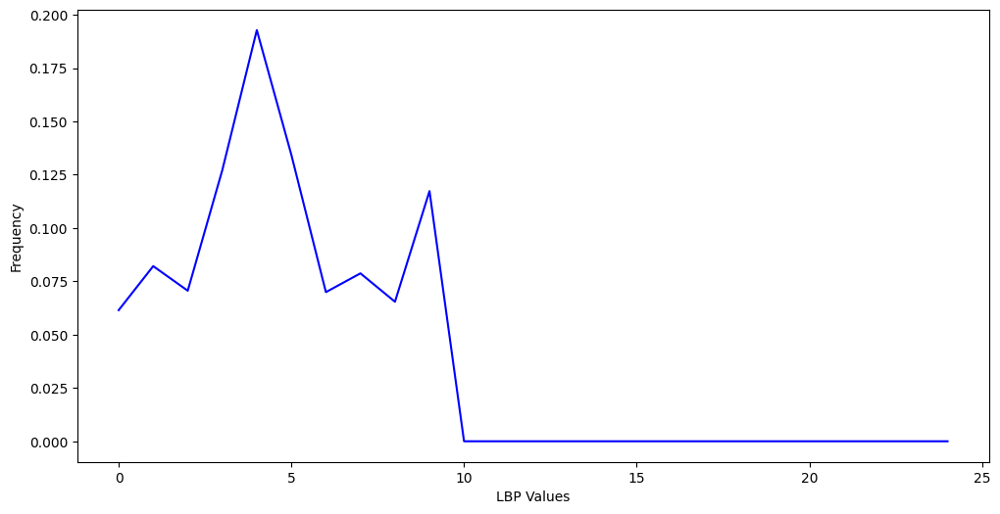

Altered Image Texture Features:
{'Contrast': 1772.0386312399355, 'Dissimilarity': 29.102367149758454, 'Homogeneity': 0.054715152563048666, 'Energy': 0.00851223783635024, 'Correlation': 0.5855617000735273, 'LBP Histogram': array([0.06150198, 0.08213439, 0.0706087 , 0.12713043, 0.19283794,
       0.13432411, 0.06994466, 0.07875099, 0.06543874, 0.11732806,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ])}


In [ ]:
from skimage.feature import graycomatrix, graycoprops, local_binary_pattern
from skimage import io, color
import matplotlib.patches as patches
import cv2
import numpy as np

def analyze_texture(image_path, coordinates):
    # Load the image
    img = io.imread(image_path)
    img_gray = color.rgb2gray(img)

    # Extract the Region of Interest (ROI)
    x, y, w, h = coordinates
    roi = img_gray[y:y+h, x:x+w]

    # Compute GLCM and texture properties
    glcm = graycomatrix((roi * 255).astype('uint8'), distances=[5], angles=[0], symmetric=True, normed=True)
    contrast = graycoprops(glcm, 'contrast')[0, 0]
    dissimilarity = graycoprops(glcm, 'dissimilarity')[0, 0]
    homogeneity = graycoprops(glcm, 'homogeneity')[0, 0]
    energy = graycoprops(glcm, 'energy')[0, 0]
    correlation = graycoprops(glcm, 'correlation')[0, 0]

    # Compute Local Binary Pattern
    lbp = local_binary_pattern(roi, P=8, R=1, method='uniform')
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=np.arange(0, 26), range=(0, 26), density=True)

    # Plotting
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    ax[0].imshow(img_gray, cmap='gray')
    # Highlight the ROI
    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
    ax[0].add_patch(rect)
    ax[0].set_title('Image with ROI')
    ax[0].axis('off')

    ax[1].imshow(roi, cmap='gray')
    ax[1].set_title('ROI - Texture Analysis')
    ax[1].axis('off')

    plt.show()


    # img = (img_gray * 255).astype(np.uint8)
    #img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    # cv2.imwrite("kandinsky5_style_sofa_with_box.png", ax[0])

    fig, ax = plt.subplots(1, 1, figsize=(12, 6))
    ax.plot(lbp_hist, color='blue')
    ax.set_xlabel('LBP Values')
    ax.set_ylabel('Frequency')
    plt.show()

    return {
        "Contrast": contrast,
        "Dissimilarity": dissimilarity,
        "Homogeneity": homogeneity,
        "Energy": energy,
        "Correlation": correlation,
        "LBP Histogram": lbp_hist
    }


# Load the images
original_img_path = 'ADE_val_00001519.jpg'
altered_img_path = 'kandinsky5_style_sofa.png'



# Define the ROI coordinates (x, y, width, height) for the sofa in both images
# These coordinates would typically be obtained via an image editor or manual selection
coords = (1, 275, 275, 230)  # Placeholder values for the original image

# Analyze the texture of the sofa ROI in the original image
original_texture_features = analyze_texture(original_img_path, coords)
print("Original Image Texture Features:")
print(original_texture_features)

# Analyze the texture of the sofa ROI in the altered image
altered_texture_features = analyze_texture(altered_img_path, coords)
print("Altered Image Texture Features:")
print(altered_texture_features)


Original:

'Contrast': 1333.5166344605475, 'Dissimilarity': 21.503655394524962, 'Homogeneity': 0.09172860582341306, 'Energy': 0.012324764660207902, 'Correlation': 0.6963154366353619

Altered Image Texture Features:

'Contrast': 1772.9523349436392, 'Dissimilarity': 29.126666666666665, 'Homogeneity': 0.05442383874529769, 'Energy': 0.00849321526832229, 'Correlation': 0.585612914206987

The Gray Level Co-occurrence Matrix (GLCM) is a method of examining the texture of an image by calculating how often pairs of pixel with specific values and in a specified spatial relationship occur in an image. It's a statistical approach to assess texture by considering the spatial relationship of pixels. GLCM functions provide a statistical view of texture based on the image's gray scale (intensity or brightness).

The texture features derived from the GLCM are used to quantify the texture of an image. Here's what each of these properties represents:

1. **Contrast**: Measures the local variations in the GLCM. High contrast values indicate a large intensity difference between neighboring pixels, implying a more textured and less smooth image.

2. **Dissimilarity**: Similar to contrast, but it gives a higher weight to pairs that differ more. It is a measure of how different the gray levels of neighboring pixel pairs are.

3. **Homogeneity**: Also called inverse difference moment, this measures the closeness of the distribution of elements in the GLCM to the GLCM diagonal. A high homogeneity value means that the distribution of intensity is very similar or uniform across the region of interest.

4. **Energy**: Also known as uniformity or angular second moment, this is a measure of textural uniformity of an image. High energy values occur when the pixel intensity distribution is constant or periodic — in other words, when texture is less complex.

5. **Correlation**: Measures the joint probability occurrence of the specified pixel pairs. A high correlation indicates a linear relationship between the gray levels of the pixel pairs.

Analyzing these results can give you insight into the texture of the region of interest, such as the sofa fabric in an image:

- If the fabric texture is supposed to be smooth and the contrast or dissimilarity is high, then the texture might look unnatural.
- If the fabric is supposed to have a distinct, regular pattern but the energy is low, the pattern may not be well captured.
- If the homogeneity is low in a supposedly uniform fabric, it may suggest that the texture appears too varied, which can look fake.
- If the correlation is low in a patterned fabric, it may indicate the pattern does not have a uniform, consistent directionality as it should.

To visualize these results more clearly, we can plot the texture features in a bar chart, which allows for easy comparison between the original and altered images. Let's write a function to compute and visualize these texture properties for a given region of interest in both the original and altered images.

Local Binary Pattern (LBP)
Local Binary Pattern is a texture descriptor; it labels the pixels of an image by thresholding the neighborhood of each pixel with the value of the center pixel and considers the result as a binary number. Then, it creates a histogram of these binary numbers that appear throughout the image.

LBP Histogram: It's a distribution of these binary patterns. The uniformity and spread of the histogram give us an idea about the texture. For example, a flat texture might have a very sharp and narrow histogram, indicating that there's not much variation in the texture patterns.

\begin{table}[h]
    \centering
    \begin{tabular}{|c|c|c|}
    \hline
    Texture Feature     & Original Image & Stylized Image\\
    \hline
    Contrast     & 1328.21 & 1772.03\\
    \hline
    Dissimilarity     & 21.44 & 29.10\\
    \hline
    Homogeneity     & 0.0919 & 0.0547\\
    \hline
    Energy     & 0.0123 & 0.0085\\
    \hline
    Correlation     & 0.6965 & 0.5855\\
    \hline
    \end{tabular}
    \caption{Caption}
    \label{tab:my_label}
\end{table}

In [ ]:
import cv2

wall:


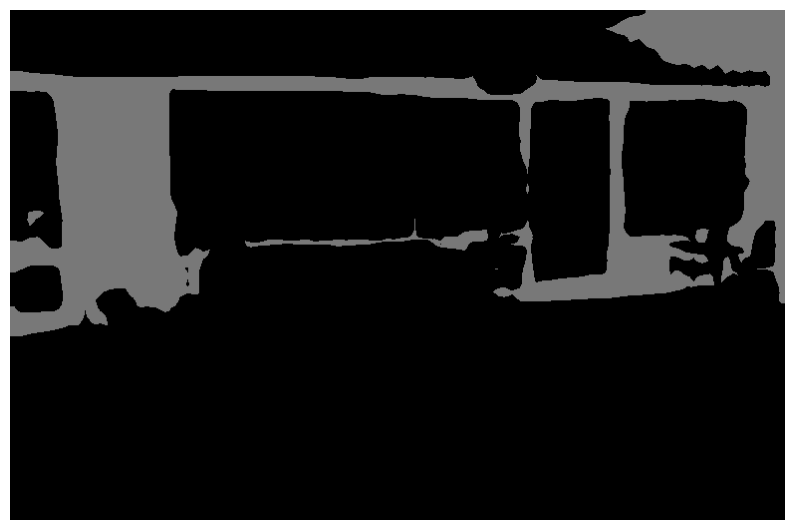

True

In [ ]:
# Load and normalize one image as a singleton tensor batch
pil_to_tensor = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(
        mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
        std=[0.229, 0.224, 0.225])  # across a large photo dataset.
])
pil_image = PIL.Image.open('ADE_val_00000532.jpg').convert('RGB')
img_original = numpy.array(pil_image)
img_data = pil_to_tensor(pil_image)
singleton_batch = {'img_data': img_data[None].cuda()}
output_size = img_data.shape[1:]

# Run the segmentation at the highest resolution.
with torch.no_grad():
    scores = segmentation_module(singleton_batch, segSize=output_size)

# Get the predicted scores for each pixel
_, pred = torch.max(scores, dim=1)
pred = pred.cpu()[0].numpy()


wall = get_result(img_original, pred, 0)
wall_location = []
for x in range(wall.shape[0]):
    for y in range(wall.shape[1]):
        if (wall[x][y] !=[0, 0, 0]).any():
            wall_location.append((x, y))

cv2.imwrite("ADE_val_00000532_wall_predicted.png", wall)

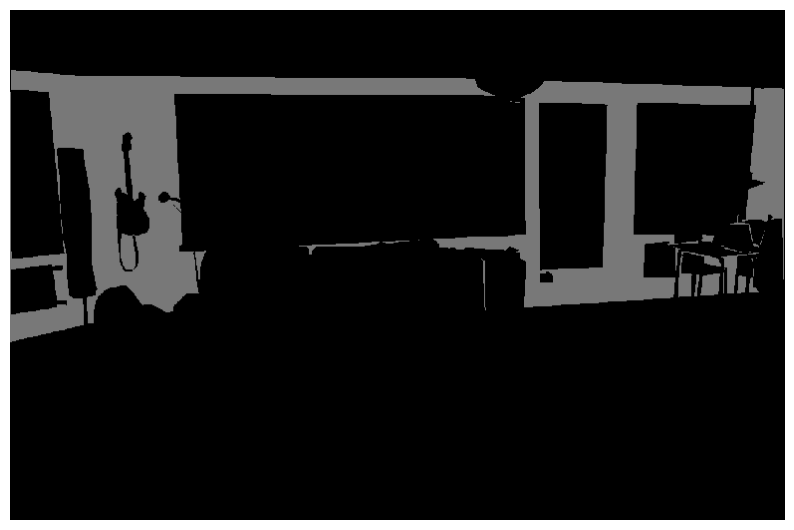

True

In [ ]:
from PIL import Image
import numpy as np

# Load the image
img_path = 'ADE_val_00000532.png'
img = Image.open(img_path)

# Convert image to numpy array
img_array = np.array(img)

# Process the image: for pixel with value [120, 120, 120], remain the same,
# for other values, change to [0, 0, 0]
processed_img_array = np.where(np.all(img_array == [120, 120, 120], axis=-1, keepdims=True), img_array, [0, 0, 0])


plt.figure(figsize=(10, 10))
plt.imshow(processed_img_array)
plt.axis('off')
plt.show()

cv2.imwrite("ADE_val_00000532_wall_truth.png", processed_img_array)
# Convert array back to image
#processed_img = Image.fromarray(processed_img_array)

# Save the processed image
#processed_img_path = '/mnt/data/processed_ADE_val_00001149.png'
#processed_img.save(processed_img_path)

# Display the processed image
#processed_img.show()


In [ ]:
names[19]

'curtain'

In [ ]:
def get_pred(img_path1, class_label, color):
    pil_to_tensor = torchvision.transforms.Compose([
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(
            mean=[0.485, 0.456, 0.406], # These are RGB mean+std values
            std=[0.229, 0.224, 0.225])  # across a large photo dataset.
    ])
    pil_image = PIL.Image.open(img_path1).convert('RGB')
    img_original = numpy.array(pil_image)
    img_data = pil_to_tensor(pil_image)
    singleton_batch = {'img_data': img_data[None].cuda()}
    output_size = img_data.shape[1:]

    # Run the segmentation at the highest resolution.
    with torch.no_grad():
        scores = segmentation_module(singleton_batch, segSize=output_size)

    # Get the predicted scores for each pixel
    _, pred = torch.max(scores, dim=1)
    pred = pred.cpu()[0].numpy()

    flag = False
    class_object = get_result(img_original, pred, class_label)
    class_object_location = []
    for x in range(class_object.shape[0]):
        for y in range(class_object.shape[1]):
            if (class_object[x][y] !=[0, 0, 0]).any():
                if flag == False:
                    print(class_object[x][y])
                    flag = True
                class_object_location.append((x, y))

    class_object = cv2.cvtColor(class_object, cv2.COLOR_RGB2BGR)
    cv2.imwrite(f"{img_path1[:-4]}_{names[class_label+1]}_pred.png", class_object)

    # img = Image.open(img_path2)
    # img_array = np.array(img)

    # processed_img_array = np.where(np.all(img_array == color, axis=-1, keepdims=True), img_array, [0, 0, 0])

    # plt.figure(figsize=(10, 10))
    # plt.imshow(processed_img_array)
    # plt.axis('off')
    # plt.show()

    # cv2.imwrite(f"{img_path[:-4]}_{names[class_label+1]}_truth.png", processed_img_array)

In [ ]:
def get_truth(img_path2, class_label, color):

    img = Image.open(img_path2)
    img_array = np.array(img)

    processed_img_array = np.where(np.all(img_array == color, axis=-1, keepdims=True), img_array, [0, 0, 0])

    plt.figure(figsize=(10, 10))
    plt.imshow(processed_img_array)
    plt.axis('off')
    plt.show()

    processed_img_array = processed_img_array.astype(np.uint8)
    processed_img_array = cv2.cvtColor(processed_img_array, cv2.COLOR_RGB2BGR)
    #cv2.imwrite("stylized_img3.png", stylized_img)

    #processed_img_array = cv2.cvtColor(processed_img_array, cv2.COLOR_RGB2BGR)
    cv2.imwrite(f"{img_path2[:-4]}_{names[class_label+1]}_truth.png", processed_img_array)

In [ ]:
names

{1: 'wall',
 2: 'building',
 3: 'sky',
 4: 'floor',
 5: 'tree',
 6: 'ceiling',
 7: 'road',
 8: 'bed',
 9: 'windowpane',
 10: 'grass',
 11: 'cabinet',
 12: 'sidewalk',
 13: 'person',
 14: 'earth',
 15: 'door',
 16: 'table',
 17: 'mountain',
 18: 'plant',
 19: 'curtain',
 20: 'chair',
 21: 'car',
 22: 'water',
 23: 'painting',
 24: 'sofa',
 25: 'shelf',
 26: 'house',
 27: 'sea',
 28: 'mirror',
 29: 'rug',
 30: 'field',
 31: 'armchair',
 32: 'seat',
 33: 'fence',
 34: 'desk',
 35: 'rock',
 36: 'wardrobe',
 37: 'lamp',
 38: 'bathtub',
 39: 'railing',
 40: 'cushion',
 41: 'base',
 42: 'box',
 43: 'column',
 44: 'signboard',
 45: 'chest',
 46: 'counter',
 47: 'sand',
 48: 'sink',
 49: 'skyscraper',
 50: 'fireplace',
 51: 'refrigerator',
 52: 'grandstand',
 53: 'path',
 54: 'stairs',
 55: 'runway',
 56: 'case',
 57: 'pool',
 58: 'pillow',
 59: 'screen',
 60: 'stairway',
 61: 'river',
 62: 'bridge',
 63: 'bookcase',
 64: 'blind',
 65: 'coffee',
 66: 'toilet',
 67: 'flower',
 68: 'book',
 69: '

lamp: 37 bed: 8 sofa: 24 chair: 20 curtain: 19 wall: 1 table: 16 cushion: 40

In [ ]:
names[4]

'cushion'

cushion:


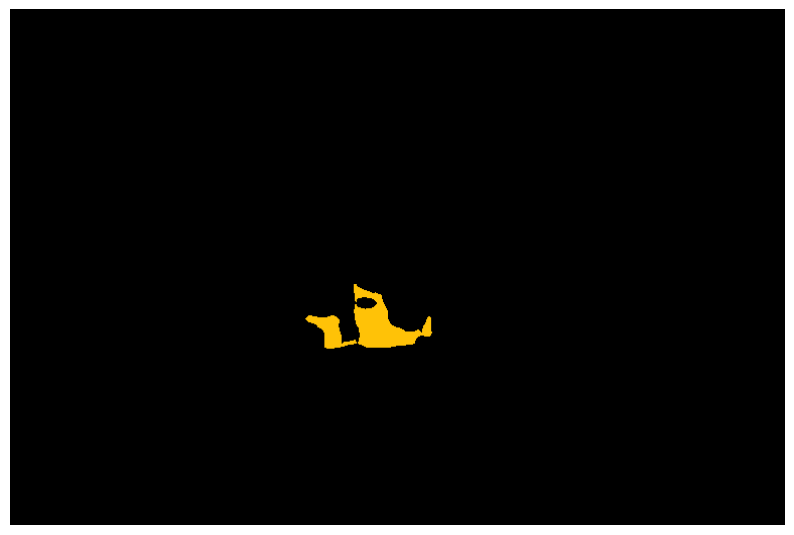

[255 194   7]
cushion:


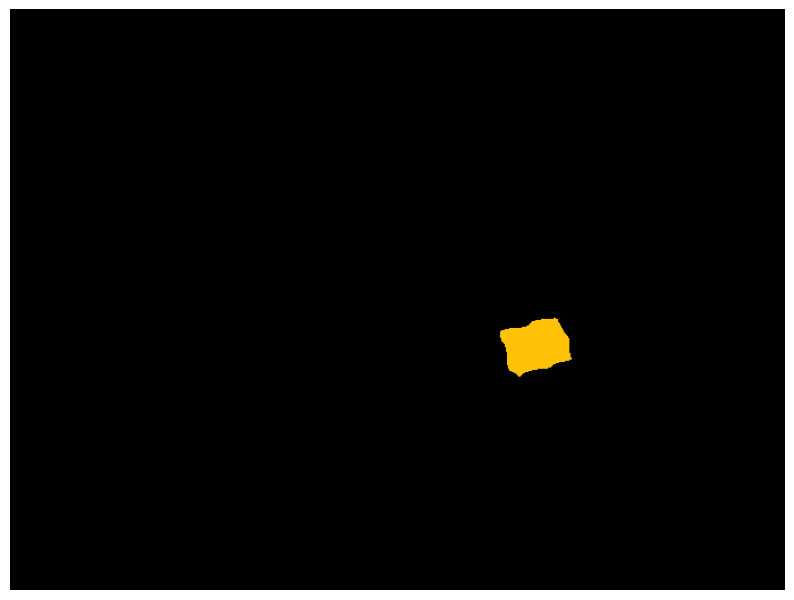

[255 194   7]
cushion:


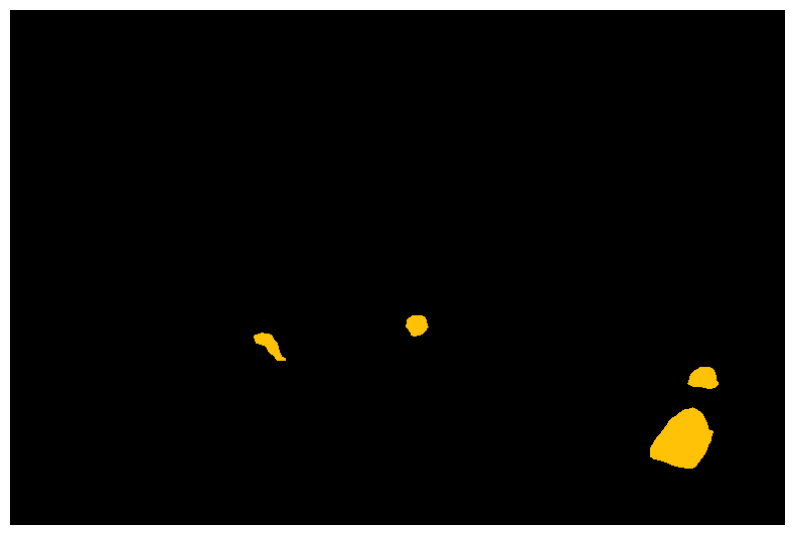

[255 194   7]
cushion:


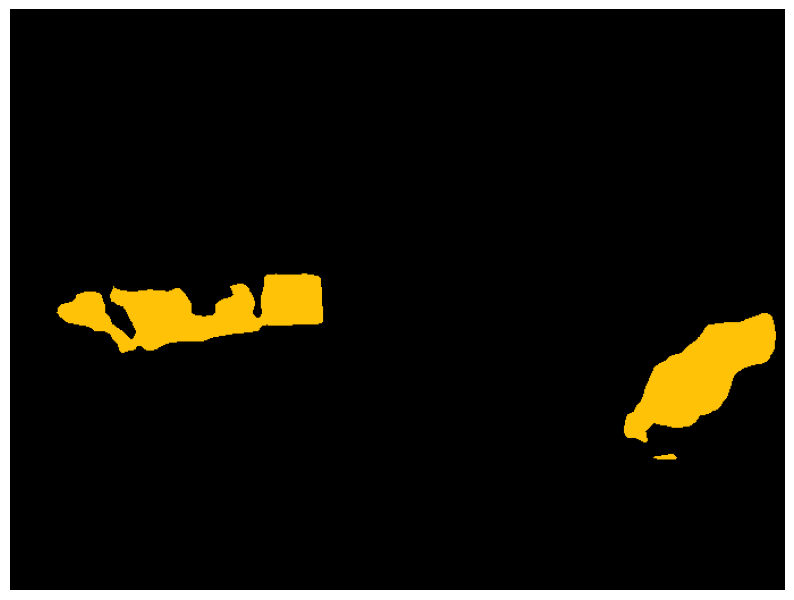

[255 194   7]
cushion:


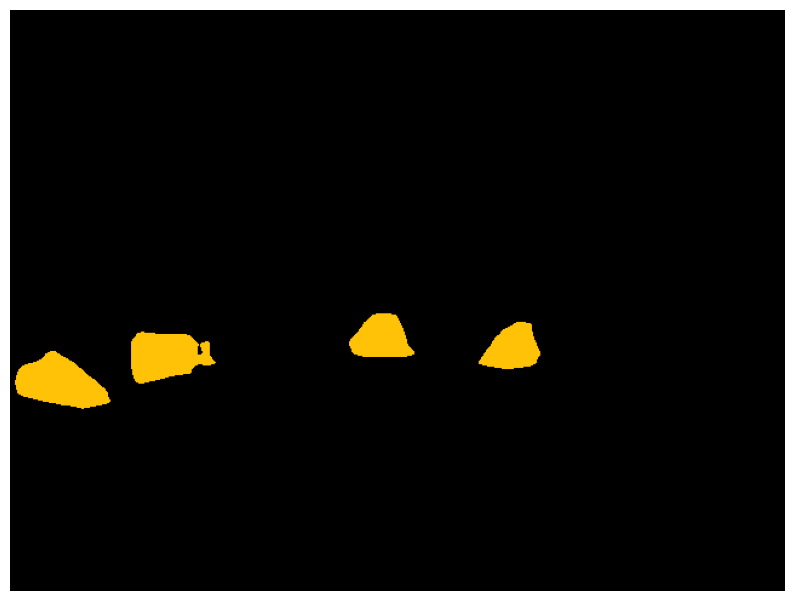

[255 194   7]
cushion:


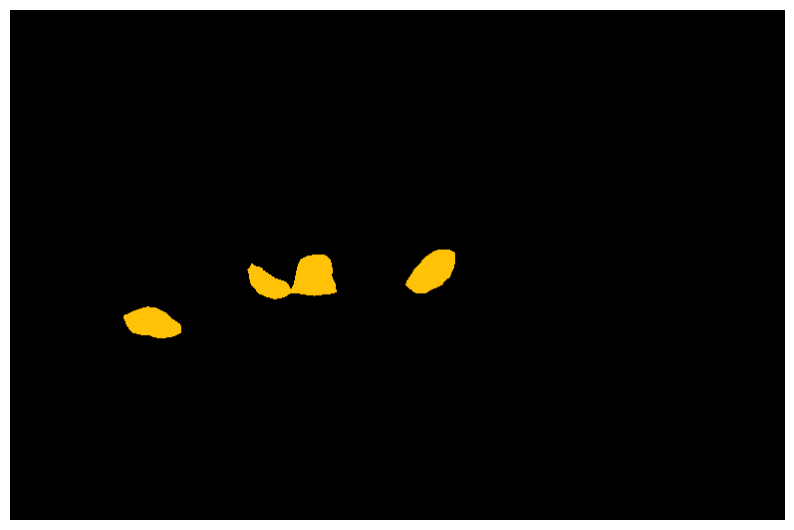

[255 194   7]
cushion:


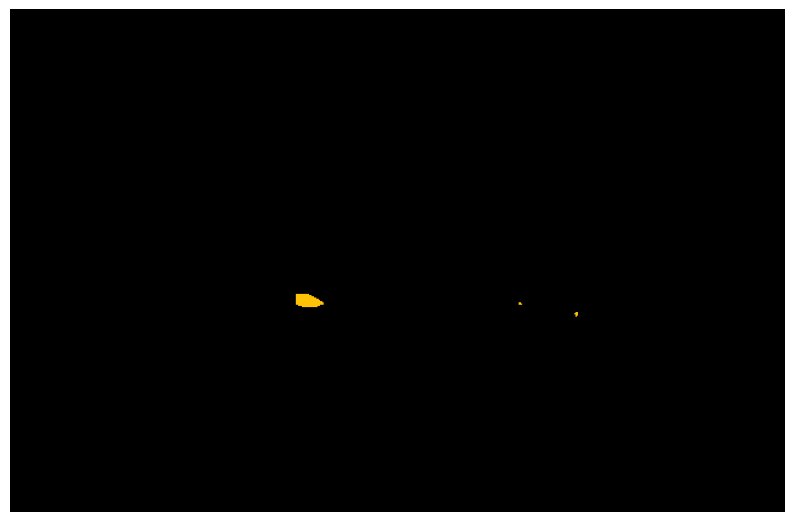

[255 194   7]
cushion:


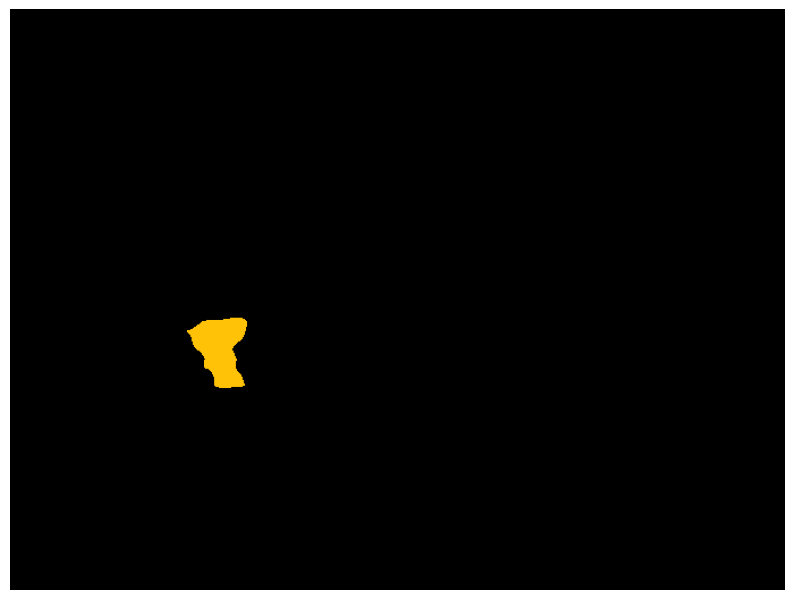

[255 194   7]
cushion:


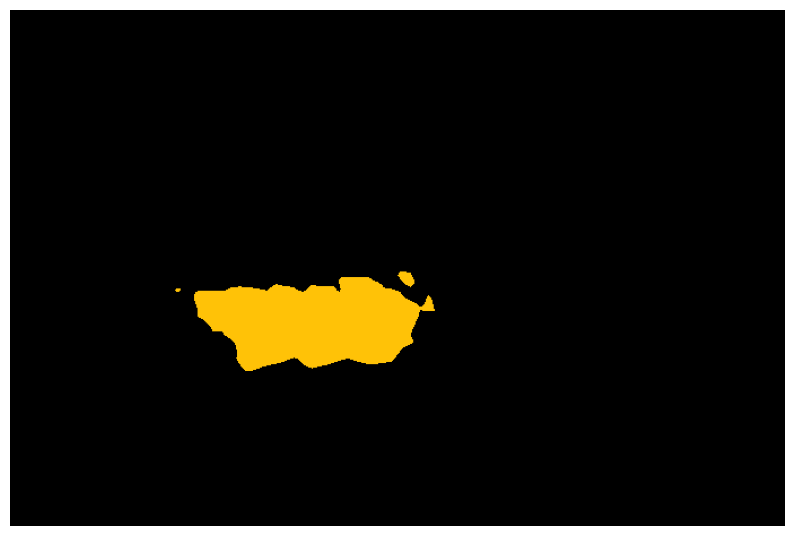

[255 194   7]
cushion:


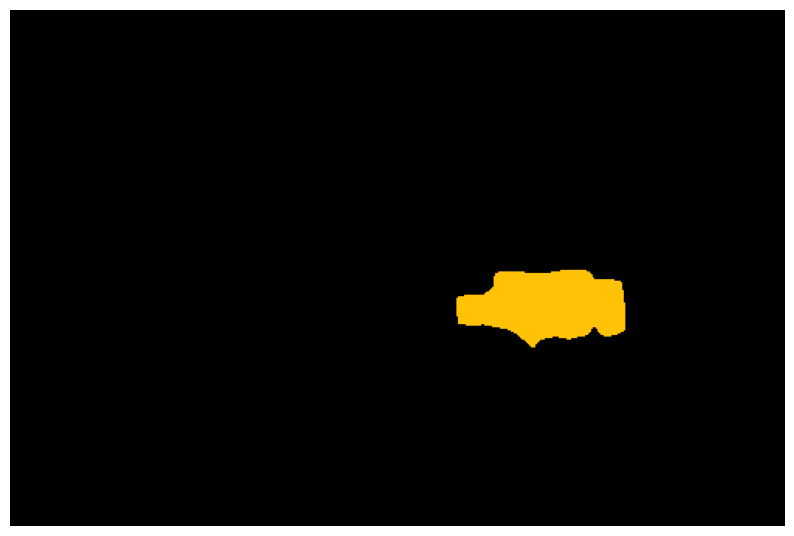

[255 194   7]


In [ ]:
imgs_1 = ['ADE_val_00000130.jpg', 'ADE_val_00000151.jpg',
          'ADE_val_00000517.jpg', 'ADE_val_00000524.jpg',
          'ADE_val_00000529.jpg', 'ADE_val_00000532.jpg',
          'ADE_val_00000698.jpg', 'ADE_val_00001160.jpg',
          'ADE_val_00001245.jpg', 'ADE_val_00001149.jpg',
          ]

imgs_2 = ['ADE_val_00000130.png', 'ADE_val_00000151.png',
          'ADE_val_00000517.png', 'ADE_val_00000524.png',
          'ADE_val_00000529.png', 'ADE_val_00000532.png',
          'ADE_val_00000698.png', 'ADE_val_00001160.png',
          'ADE_val_00001245.png', 'ADE_val_00001149_seg.png',
          ]

class_label = 39


for im1 in imgs_1:
    # for im2 in imgs_2:
    get_pred(im1, class_label, color)

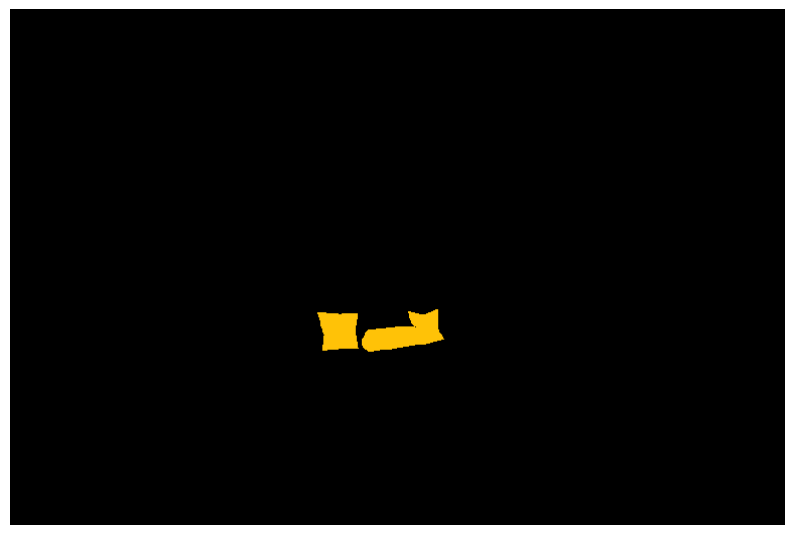

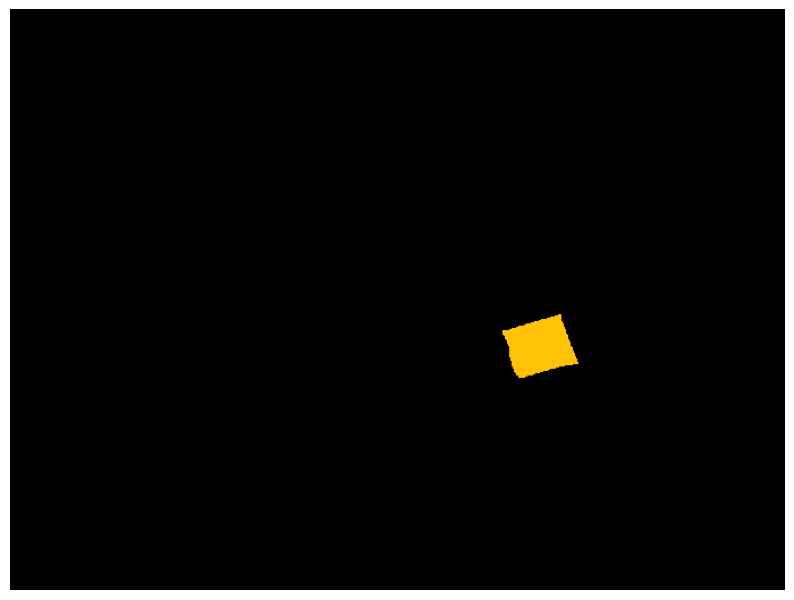

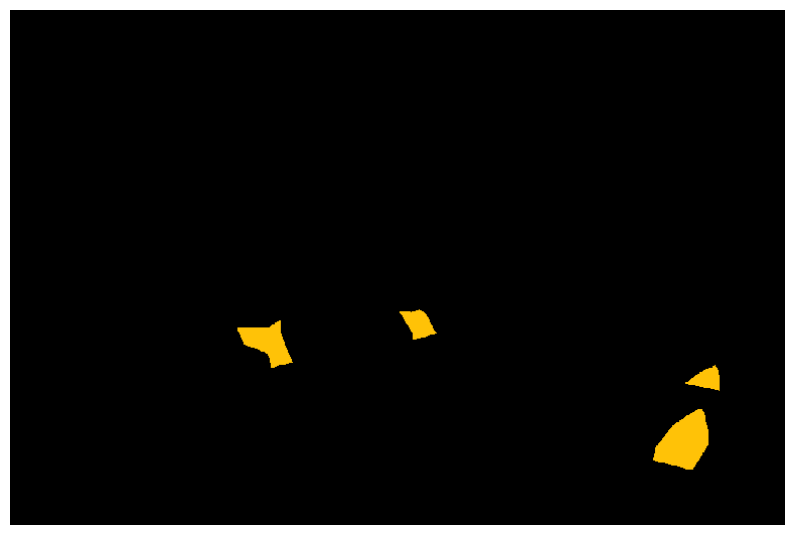

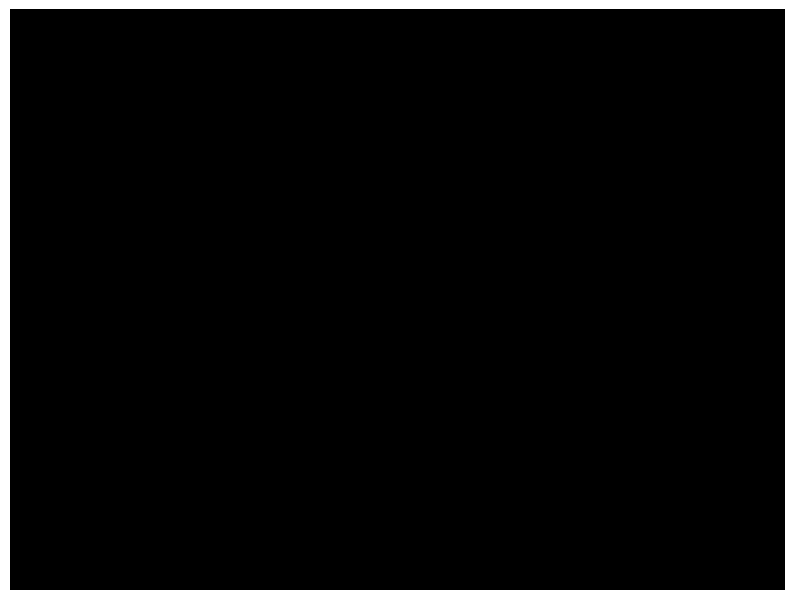

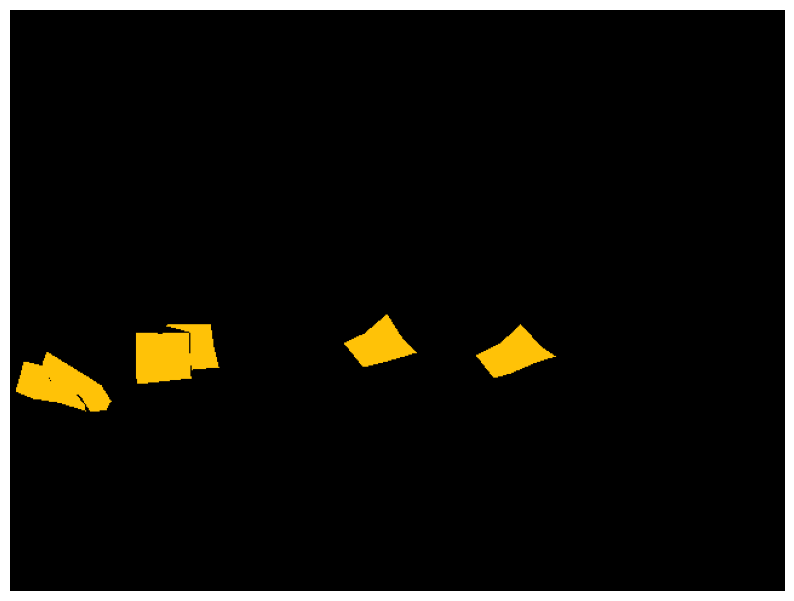

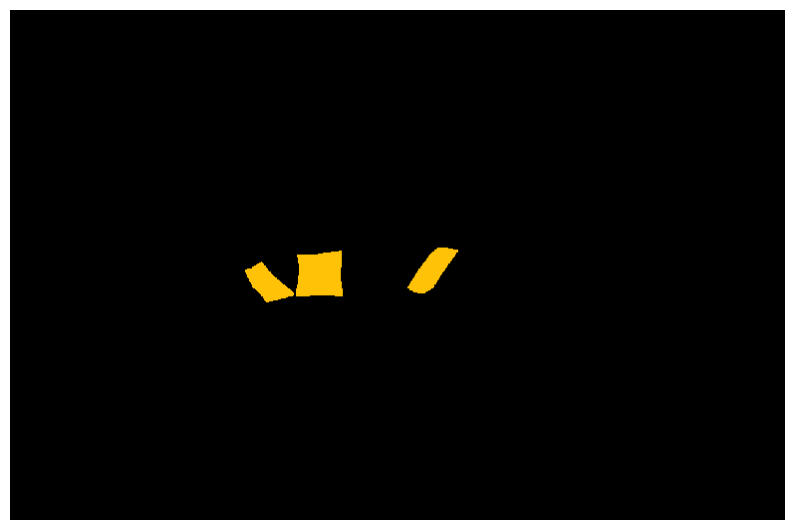

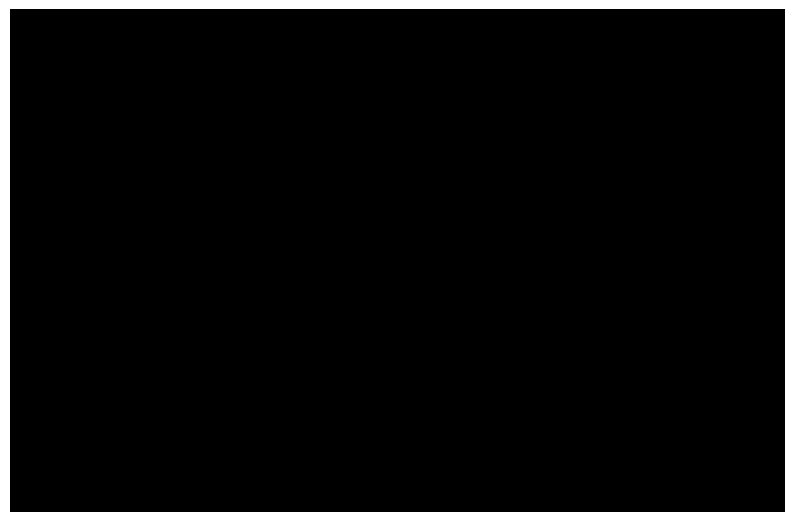

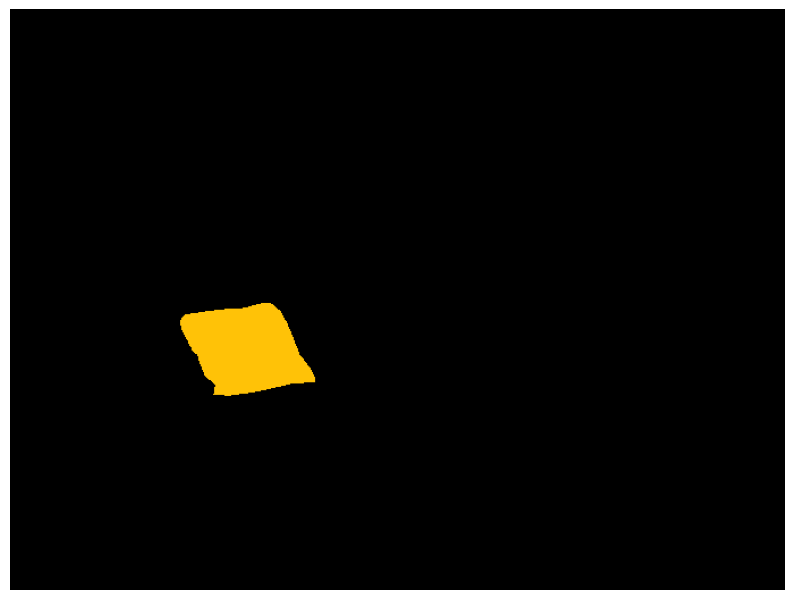

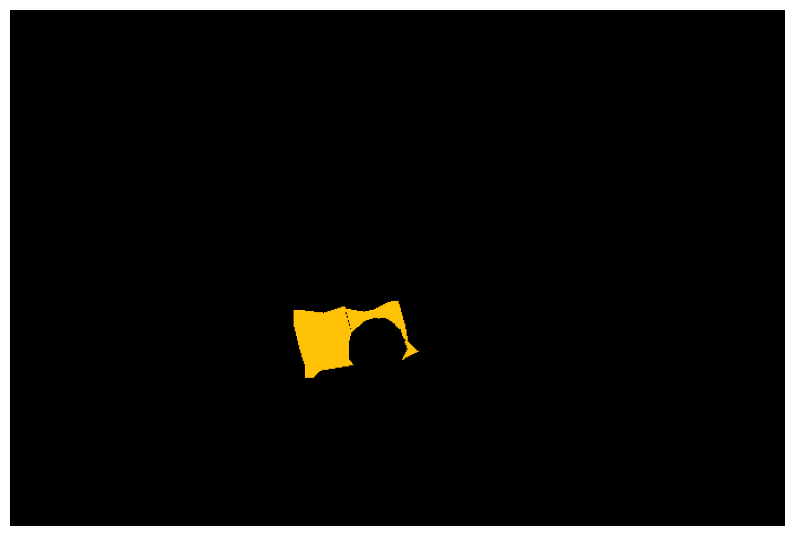

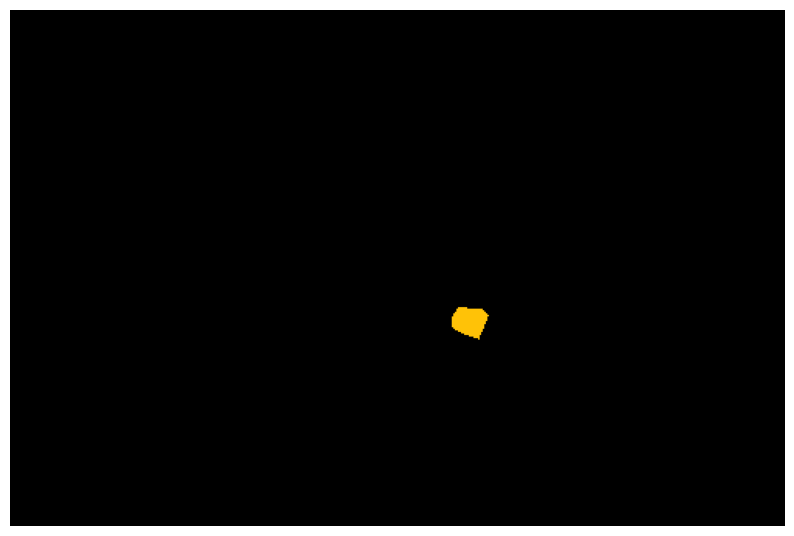

In [ ]:
color = [255, 194, 7]
for im2 in imgs_2:
    get_truth(im2, class_label, color)

In [ ]:
def confusion(truth, pred, c):
    wall_ground_truth_img = Image.open(truth)
    wall_predicted_img = Image.open(pred)

    # Convert images to numpy arrays
    wall_ground_truth_array = np.array(wall_ground_truth_img)
    wall_predicted_array = np.array(wall_predicted_img)

    # Calculate the confusion matrix components for the grey part (value [120, 120, 120])
    # True Positives (TP): Predicted == Grey, Actual == Grey
    # TP = np.sum((wall_predicted_array == 120) & (wall_ground_truth_array == 120))
    # # True Negatives (TN): Predicted != Grey, Actual != Grey
    # TN = np.sum((wall_predicted_array != 120) & (wall_ground_truth_array != 120))
    # # False Positives (FP): Predicted == Grey, Actual != Grey
    # FP = np.sum((wall_predicted_array == 120) & (wall_ground_truth_array != 120))
    # # False Negatives (FN): Predicted != Grey, Actual == Grey
    # FN = np.sum((wall_predicted_array != 120) & (wall_ground_truth_array == 120))

    new_color_value = c

    # Calculate the confusion matrix components for the new color value
    # True Positives (TP): Predicted == New Color, Actual == New Color
    TP = np.sum((wall_predicted_array == new_color_value).all(axis=-1) & (wall_ground_truth_array == new_color_value).all(axis=-1))
    # True Negatives (TN): Predicted != New Color, Actual != New Color
    TN = np.sum(~(wall_predicted_array == new_color_value).all(axis=-1) & ~(wall_ground_truth_array == new_color_value).all(axis=-1))
    # False Positives (FP): Predicted == New Color, Actual != New Color
    FP = np.sum((wall_predicted_array == new_color_value).all(axis=-1) & ~(wall_ground_truth_array == new_color_value).all(axis=-1))
    # False Negatives (FN): Predicted != New Color, Actual == New Color
    FN = np.sum(~(wall_predicted_array == new_color_value).all(axis=-1) & (wall_ground_truth_array == new_color_value).all(axis=-1))


    # Construct the confusion matrix
    # wall_confusion_matrix = np.array([[TP, FP], [FN, TN]])
    wall_confusion_matrix = np.array([[TP, FP], [FN, TN]])

    # Calculate precision, recall, accuracy, and F1 score
    wall_precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    wall_recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    wall_accuracy = (TP + TN) / (TP + TN + FP + FN)
    wall_f1_score = 2 * (wall_precision * wall_recall) / (wall_precision + wall_recall) if (wall_precision + wall_recall) > 0 else 0

    print(pred[:-4])
    print("confusion_matrix: ", wall_confusion_matrix)
    print("precision: ", wall_precision)
    print("recall: ", wall_recall)
    print("accuracy: ", wall_accuracy)
    print("f1: ", wall_f1_score)

In [ ]:
confusion('ADE_val_00000130_cushion_truth.png', 'ADE_val_00000130_cushion_pred.png')

ADE_val_00000130_cushion_pred
confusion_matrix:  [[  1693   1163]
 [  1434 389438]]
precision:  0.5927871148459384
recall:  0.5414134953629677
accuracy:  0.9934040759102731
f1:  0.565936820992813


In [ ]:
cushion_color = [255, 194, 7]
wall_color = [120, 120, 120]
lamp_color = [224, 255, 8]
bed_color = [204, 5, 255]
sofa_color = [11, 102, 255]
chair_color = [204, 70, 3]
curtain_color = [255, 51, 7]
table_color = [255, 6, 82]

In [ ]:
bed_truths = ['ADE_val_00000130_bed_truth.png', 'ADE_val_00000151_bed_truth.png',
          'ADE_val_00000517_bed_truth.png', 'ADE_val_00000524_bed_truth.png',
          'ADE_val_00000529_bed_truth.png', 'ADE_val_00000532_bed_truth.png',
          'ADE_val_00000698_bed_truth.png', 'ADE_val_00001149_seg_bed_truth.png',
              'ADE_val_00001160_bed_truth.png', 'ADE_val_00001245_bed_truth.png']

bed_preds = ['ADE_val_00000130_bed_pred.png', 'ADE_val_00000151_bed_pred.png',
          'ADE_val_00000517_bed_pred.png', 'ADE_val_00000524_bed_pred.png',
          'ADE_val_00000529_bed_pred.png', 'ADE_val_00000532_bed_pred.png',
          'ADE_val_00000698_bed_pred.png', 'ADE_val_00001149_bed_pred.png',
              'ADE_val_00001160_bed_pred.png', 'ADE_val_00001245_bed_pred.png']

for t, p in zip(bed_truths, bed_preds):
    print(t, p)
    confusion(t, p, bed_color)

ADE_val_00000130_bed_truth.png ADE_val_00000130_bed_pred.png
ADE_val_00000130_bed_pred
confusion_matrix:  [[ 64929   1874]
 [  3845 323080]]
precision:  0.9719473676331901
recall:  0.944092244162038
accuracy:  0.9854747439856957
f1:  0.9578173288979693
ADE_val_00000151_bed_truth.png ADE_val_00000151_bed_pred.png
ADE_val_00000151_bed_pred
confusion_matrix:  [[ 61549   4707]
 [  1767 281673]]
precision:  0.9289573774450616
recall:  0.9720923621201591
accuracy:  0.9814867770863837
f1:  0.9500355014972371
ADE_val_00000517_bed_truth.png ADE_val_00000517_bed_pred.png
ADE_val_00000517_bed_pred
confusion_matrix:  [[     0      0]
 [     0 394240]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000524_bed_truth.png ADE_val_00000524_bed_pred.png
ADE_val_00000524_bed_pred
confusion_matrix:  [[     0      0]
 [     0 349696]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000529_bed_truth.png ADE_val_00000529_bed_pred.png
ADE_val_00000529_bed_pred
confusion_matrix:  [[     0   

In [ ]:
chair_truths = ['ADE_val_00000130_chair_truth.png', 'ADE_val_00000151_chair_truth.png',
          'ADE_val_00000517_chair_truth.png', 'ADE_val_00000524_chair_truth.png',
          'ADE_val_00000529_chair_truth.png', 'ADE_val_00000532_chair_truth.png',
          'ADE_val_00000698_chair_truth.png', 'ADE_val_00001149_seg_chair_truth.png',
              'ADE_val_00001160_chair_truth.png', 'ADE_val_00001245_chair_truth.png']

chair_preds = ['ADE_val_00000130_chair_pred.png', 'ADE_val_00000151_chair_pred.png',
          'ADE_val_00000517_chair_pred.png', 'ADE_val_00000524_chair_pred.png',
          'ADE_val_00000529_chair_pred.png', 'ADE_val_00000532_chair_pred.png',
          'ADE_val_00000698_chair_pred.png', 'ADE_val_00001149_chair_pred.png',
              'ADE_val_00001160_chair_pred.png', 'ADE_val_00001245_chair_pred.png']

for t, p in zip(chair_truths, chair_preds):
    print(t, p)
    confusion(t, p, chair_color)

ADE_val_00000130_chair_truth.png ADE_val_00000130_chair_pred.png
ADE_val_00000130_chair_pred
confusion_matrix:  [[     0      0]
 [     0 393728]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000151_chair_truth.png ADE_val_00000151_chair_pred.png
ADE_val_00000151_chair_pred
confusion_matrix:  [[     0  15395]
 [     0 334301]]
precision:  0.0
recall:  0
accuracy:  0.9559760477672035
f1:  0
ADE_val_00000517_chair_truth.png ADE_val_00000517_chair_pred.png
ADE_val_00000517_chair_pred
confusion_matrix:  [[     0      0]
 [     0 394240]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000524_chair_truth.png ADE_val_00000524_chair_pred.png
ADE_val_00000524_chair_pred
confusion_matrix:  [[     0   1600]
 [     0 348096]]
precision:  0.0
recall:  0
accuracy:  0.9954245973645681
f1:  0
ADE_val_00000529_chair_truth.png ADE_val_00000529_chair_pred.png
ADE_val_00000529_chair_pred
confusion_matrix:  [[  6284   1797]
 [  5356 293763]]
precision:  0.7776265313698799
recall:  0.5

In [ ]:
curtain_truths = ['ADE_val_00000130_curtain_truth.png', 'ADE_val_00000151_curtain_truth.png',
          'ADE_val_00000517_curtain_truth.png', 'ADE_val_00000524_curtain_truth.png',
          'ADE_val_00000529_curtain_truth.png', 'ADE_val_00000532_curtain_truth.png',
          'ADE_val_00000698_curtain_truth.png', 'ADE_val_00001149_seg_curtain_truth.png',
              'ADE_val_00001160_curtain_truth.png', 'ADE_val_00001245_curtain_truth.png']

curtain_preds = ['ADE_val_00000130_curtain_pred.png', 'ADE_val_00000151_curtain_pred.png',
          'ADE_val_00000517_curtain_pred.png', 'ADE_val_00000524_curtain_pred.png',
          'ADE_val_00000529_curtain_pred.png', 'ADE_val_00000532_curtain_pred.png',
          'ADE_val_00000698_curtain_pred.png', 'ADE_val_00001149_curtain_pred.png',
              'ADE_val_00001160_curtain_pred.png', 'ADE_val_00001245_curtain_pred.png']

for t, p in zip(curtain_truths, curtain_preds):
    print(t, p)
    confusion(t, p, curtain_color)

ADE_val_00000130_curtain_truth.png ADE_val_00000130_curtain_pred.png
ADE_val_00000130_curtain_pred
confusion_matrix:  [[     0      0]
 [     0 393728]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000151_curtain_truth.png ADE_val_00000151_curtain_pred.png
ADE_val_00000151_curtain_pred
confusion_matrix:  [[ 23583   1499]
 [   394 324220]]
precision:  0.9402360258352603
recall:  0.9835675856028694
accuracy:  0.9945867267569546
f1:  0.9614138078640004
ADE_val_00000517_curtain_truth.png ADE_val_00000517_curtain_pred.png
ADE_val_00000517_curtain_pred
confusion_matrix:  [[     0      0]
 [     0 394240]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000524_curtain_truth.png ADE_val_00000524_curtain_pred.png
ADE_val_00000524_curtain_pred
confusion_matrix:  [[     0      0]
 [     0 349696]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000529_curtain_truth.png ADE_val_00000529_curtain_pred.png
ADE_val_00000529_curtain_pred
confusion_matrix:  [[  4389   1674]

In [ ]:
cushion_truths = ['ADE_val_00000130_cushion_truth.png', 'ADE_val_00000151_cushion_truth.png',
          'ADE_val_00000517_cushion_truth.png', 'ADE_val_00000524_cushion_truth.png',
          'ADE_val_00000529_cushion_truth.png', 'ADE_val_00000532_cushion_truth.png',
          'ADE_val_00000698_cushion_truth.png', 'ADE_val_00001149_seg_cushion_truth.png',
              'ADE_val_00001160_cushion_truth.png', 'ADE_val_00001245_cushion_truth.png']

cushion_preds = ['ADE_val_00000130_cushion_pred.png', 'ADE_val_00000151_cushion_pred.png',
          'ADE_val_00000517_cushion_pred.png', 'ADE_val_00000524_cushion_pred.png',
          'ADE_val_00000529_cushion_pred.png', 'ADE_val_00000532_cushion_pred.png',
          'ADE_val_00000698_cushion_pred.png', 'ADE_val_00001149_cushion_pred.png',
              'ADE_val_00001160_cushion_pred.png', 'ADE_val_00001245_cushion_pred.png']

for t, p in zip(cushion_truths, cushion_preds):
    print(t, p)
    confusion(t, p, cushion_color)

ADE_val_00000130_cushion_truth.png ADE_val_00000130_cushion_pred.png
ADE_val_00000130_cushion_pred
confusion_matrix:  [[  1693   1163]
 [  1434 389438]]
precision:  0.5927871148459384
recall:  0.5414134953629677
accuracy:  0.9934040759102731
f1:  0.565936820992813
ADE_val_00000151_cushion_truth.png ADE_val_00000151_cushion_pred.png
ADE_val_00000151_cushion_pred
confusion_matrix:  [[  2096    128]
 [   316 347156]]
precision:  0.9424460431654677
recall:  0.8689883913764511
accuracy:  0.9987303257686676
f1:  0.9042277825711822
ADE_val_00000517_cushion_truth.png ADE_val_00000517_cushion_pred.png
ADE_val_00000517_cushion_pred
confusion_matrix:  [[  3184    599]
 [  1308 389149]]
precision:  0.8416600581549035
recall:  0.7088156723063224
accuracy:  0.9951628449675325
f1:  0.7695468277945621
ADE_val_00000524_cushion_truth.png ADE_val_00000524_cushion_pred.png
ADE_val_00000524_cushion_pred
confusion_matrix:  [[     0  15490]
 [     0 334206]]
precision:  0.0
recall:  0
accuracy:  0.9557043832

In [ ]:
lamp_truths = ['ADE_val_00000130_lamp_truth.png', 'ADE_val_00000151_lamp_truth.png',
          'ADE_val_00000517_lamp_truth.png', 'ADE_val_00000524_lamp_truth.png',
          'ADE_val_00000529_lamp_truth.png', 'ADE_val_00000532_lamp_truth.png',
          'ADE_val_00000698_lamp_truth.png', 'ADE_val_00001149_seg_lamp_truth.png',
              'ADE_val_00001160_lamp_truth.png', 'ADE_val_00001245_lamp_truth.png']

lamp_preds = ['ADE_val_00000130_lamp_pred.png', 'ADE_val_00000151_lamp_pred.png',
          'ADE_val_00000517_lamp_pred.png', 'ADE_val_00000524_lamp_pred.png',
          'ADE_val_00000529_lamp_pred.png', 'ADE_val_00000532_lamp_pred.png',
          'ADE_val_00000698_lamp_pred.png', 'ADE_val_00001149_lamp_pred.png',
              'ADE_val_00001160_lamp_pred.png', 'ADE_val_00001245_lamp_pred.png']

for t, p in zip(lamp_truths, lamp_preds):
    print(t, p)
    confusion(t, p, lamp_color)

ADE_val_00000130_lamp_truth.png ADE_val_00000130_lamp_pred.png
ADE_val_00000130_lamp_pred
confusion_matrix:  [[  1382    266]
 [   548 391532]]
precision:  0.8385922330097088
recall:  0.7160621761658031
accuracy:  0.99793258289987
f1:  0.7724986025712689
ADE_val_00000151_lamp_truth.png ADE_val_00000151_lamp_pred.png
ADE_val_00000151_lamp_pred
confusion_matrix:  [[  3864    670]
 [   860 344302]]
precision:  0.8522276135862373
recall:  0.8179508890770534
accuracy:  0.9956247712298683
f1:  0.8347375243033052
ADE_val_00000517_lamp_truth.png ADE_val_00000517_lamp_pred.png
ADE_val_00000517_lamp_pred
confusion_matrix:  [[   583    463]
 [   484 392710]]
precision:  0.5573613766730402
recall:  0.5463917525773195
accuracy:  0.9975979099025974
f1:  0.5518220539517273
ADE_val_00000524_lamp_truth.png ADE_val_00000524_lamp_pred.png
ADE_val_00000524_lamp_pred
confusion_matrix:  [[   854    185]
 [   510 348147]]
precision:  0.821944177093359
recall:  0.626099706744868
accuracy:  0.9980125594802343


In [ ]:
sofa_truths = ['ADE_val_00000130_sofa_truth.png', 'ADE_val_00000151_sofa_truth.png',
          'ADE_val_00000517_sofa_truth.png', 'ADE_val_00000524_sofa_truth.png',
          'ADE_val_00000529_sofa_truth.png', 'ADE_val_00000532_sofa_truth.png',
          'ADE_val_00000698_sofa_truth.png', 'ADE_val_00001149_seg_sofa_truth.png',
              'ADE_val_00001160_sofa_truth.png', 'ADE_val_00001245_sofa_truth.png']

sofa_preds = ['ADE_val_00000130_sofa_pred.png', 'ADE_val_00000151_sofa_pred.png',
          'ADE_val_00000517_sofa_pred.png', 'ADE_val_00000524_sofa_pred.png',
          'ADE_val_00000529_sofa_pred.png', 'ADE_val_00000532_sofa_pred.png',
          'ADE_val_00000698_sofa_pred.png', 'ADE_val_00001149_sofa_pred.png',
              'ADE_val_00001160_sofa_pred.png', 'ADE_val_00001245_sofa_pred.png']

for t, p in zip(sofa_truths, sofa_preds):
    print(t, p)
    confusion(t, p, sofa_color)

ADE_val_00000130_sofa_truth.png ADE_val_00000130_sofa_pred.png
ADE_val_00000130_sofa_pred
confusion_matrix:  [[     0      0]
 [     0 393728]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000151_sofa_truth.png ADE_val_00000151_sofa_pred.png
ADE_val_00000151_sofa_pred
confusion_matrix:  [[     0      0]
 [     0 349696]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000517_sofa_truth.png ADE_val_00000517_sofa_pred.png
ADE_val_00000517_sofa_pred
confusion_matrix:  [[ 17686  17852]
 [   821 357881]]
precision:  0.4976644718329675
recall:  0.9556384070892094
accuracy:  0.952635450487013
f1:  0.6544916273475807
ADE_val_00000524_sofa_truth.png ADE_val_00000524_sofa_pred.png
ADE_val_00000524_sofa_pred
confusion_matrix:  [[ 18917  12170]
 [  9238 309371]]
precision:  0.6085180300447133
recall:  0.6718877641626709
accuracy:  0.938781112737921
f1:  0.6386347523716281
ADE_val_00000529_sofa_truth.png ADE_val_00000529_sofa_pred.png
ADE_val_00000529_sofa_pred
confusion_matrix

In [ ]:
table_truths = ['ADE_val_00000130_table_truth.png', 'ADE_val_00000151_table_truth.png',
          'ADE_val_00000517_table_truth.png', 'ADE_val_00000524_table_truth.png',
          'ADE_val_00000529_table_truth.png', 'ADE_val_00000532_table_truth.png',
          'ADE_val_00000698_table_truth.png', 'ADE_val_00001149_seg_table_truth.png',
              'ADE_val_00001160_table_truth.png', 'ADE_val_00001245_table_truth.png']

table_preds = ['ADE_val_00000130_table_pred.png', 'ADE_val_00000151_table_pred.png',
          'ADE_val_00000517_table_pred.png', 'ADE_val_00000524_table_pred.png',
          'ADE_val_00000529_table_pred.png', 'ADE_val_00000532_table_pred.png',
          'ADE_val_00000698_table_pred.png', 'ADE_val_00001149_table_pred.png',
              'ADE_val_00001160_table_pred.png', 'ADE_val_00001245_table_pred.png']

for t, p in zip(table_truths, table_preds):
    print(t, p)
    confusion(t, p, table_color)

ADE_val_00000130_table_truth.png ADE_val_00000130_table_pred.png
ADE_val_00000130_table_pred
confusion_matrix:  [[   150    167]
 [   123 393288]]
precision:  0.47318611987381703
recall:  0.5494505494505495
accuracy:  0.9992634509102731
f1:  0.5084745762711865
ADE_val_00000151_table_truth.png ADE_val_00000151_table_pred.png
ADE_val_00000151_table_pred
confusion_matrix:  [[  6183    886]
 [   237 342390]]
precision:  0.8746640260291413
recall:  0.9630841121495327
accuracy:  0.9967886392752562
f1:  0.9167469790199422
ADE_val_00000517_table_truth.png ADE_val_00000517_table_pred.png
ADE_val_00000517_table_pred
confusion_matrix:  [[     0      0]
 [     0 394240]]
precision:  0
recall:  0
accuracy:  1.0
f1:  0
ADE_val_00000524_table_truth.png ADE_val_00000524_table_pred.png
ADE_val_00000524_table_pred
confusion_matrix:  [[     0     26]
 [  9642 340028]]
precision:  0.0
recall:  0.0
accuracy:  0.9723531295754027
f1:  0
ADE_val_00000529_table_truth.png ADE_val_00000529_table_pred.png
ADE_val

In [ ]:
wall_truths = ['ADE_val_00000130_wall_truth.png', 'ADE_val_00000151_wall_truth.png',
          'ADE_val_00000517_wall_truth.png', 'ADE_val_00000524_wall_truth.png',
          'ADE_val_00000529_wall_truth.png', 'ADE_val_00000532_wall_truth.png',
          'ADE_val_00000698_wall_truth.png', 'ADE_val_00001149_seg_wall_truth.png',
              'ADE_val_00001160_wall_truth.png', 'ADE_val_00001245_wall_truth.png']

wall_preds = ['ADE_val_00000130_wall_pred.png', 'ADE_val_00000151_wall_pred.png',
          'ADE_val_00000517_wall_pred.png', 'ADE_val_00000524_wall_pred.png',
          'ADE_val_00000529_wall_pred.png', 'ADE_val_00000532_wall_pred.png',
          'ADE_val_00000698_wall_pred.png', 'ADE_val_00001149_wall_pred.png',
              'ADE_val_00001160_wall_pred.png', 'ADE_val_00001245_wall_pred.png']

for t, p in zip(wall_truths, wall_preds):
    print(t, p)
    confusion(t, p, wall_color)

ADE_val_00000130_wall_truth.png ADE_val_00000130_wall_pred.png
ADE_val_00000130_wall_pred
confusion_matrix:  [[142988  15494]
 [  5288 229958]]
precision:  0.9022349541272826
recall:  0.9643367773611373
accuracy:  0.9472173683355006
f1:  0.9322527855834241
ADE_val_00000151_wall_truth.png ADE_val_00000151_wall_pred.png
ADE_val_00000151_wall_pred
confusion_matrix:  [[ 72119   6114]
 [  4317 267146]]
precision:  0.9218488361688801
recall:  0.9435213773614527
accuracy:  0.9701712344436311
f1:  0.9325592070809275
ADE_val_00000517_wall_truth.png ADE_val_00000517_wall_pred.png
ADE_val_00000517_wall_pred
confusion_matrix:  [[ 85960   4296]
 [  3986 299998]]
precision:  0.9524020563729835
recall:  0.9556845218242056
accuracy:  0.9789924918831169
f1:  0.9540404656996037
ADE_val_00000524_wall_truth.png ADE_val_00000524_wall_pred.png
ADE_val_00000524_wall_pred
confusion_matrix:  [[ 36553  43816]
 [    45 269282]]
precision:  0.4548146673468626
recall:  0.9987704246133668
accuracy:  0.8745739156295

In [ ]:
(9854+9814+9409+9680+9802)/5

9711.8

In [ ]:
(9578+9500+6559+9397+9524)/5

8911.6

In [ ]:
(9767+9796+9698)/3

9753.666666666666

In [ ]:
(6372+3946+6051)/3

5456.333333333333

In [ ]:
(9945+9938+9868+9880+9702+9906)/6

9873.166666666666

In [ ]:
(9614+8221+2797+8152+9332+8375)/6

7748.5

In [ ]:
(9934+9987+9951+9929+9936+9771+9869+9696)/8

9884.125

In [ ]:
(5659+9042+7695+8518+7199+966+4724+3795)/8

5949.75

In [ ]:
(9979+9956+9975+9980+9973+9806+9983+9904+9963+9934)/10

9945.3

In [ ]:
(7724+8347+5518+7107+8269+1916+8324+7055+7761+3633)/10

6565.4

In [ ]:
(9526+9387+9646+9890+9628)/5

9615.4

In [ ]:
(6544+6386+8012+8594+8741)/5

7655.4

In [ ]:
(9992+9967+9587+9892+9873+9855+9928+9843)/8

9867.125

In [ ]:
(5084+9167+6573+6156+8695+7816+6703+1444)/8

6454.75

In [ ]:
(9472+9701+9789+8745+9398+9135+9352+9347+9600+9313)/10

9385.2

In [ ]:
(9322+9325+9540+6250+8583+7211+9123+9240+9165+9018)/10

8677.7